# **Import necessary libraries** ⏬

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data frame 
#visualization
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
from matplotlib import cm
from matplotlib.ticker import LinearLocator
import seaborn as sns
import plotly.express as px #more common and simple use
import plotly.graph_objects as go #work moslty on graph objects (more heavy and dynamic) easier to control
from plotly.subplots import make_subplots
#Null values 
import missingno as msno
from sklearn.impute import KNNImputer # KNN Fill null values
#T-test 
from scipy import stats 
import scipy
import scipy.integrate as integrate
#Scale
from sklearn.preprocessing import MinMaxScaler
#Feature importance
from sklearn.feature_selection import SelectKBest , chi2 #Feature selection
from xgboost import XGBClassifier #feature importance
from sklearn.ensemble import ExtraTreesClassifier ##feature importance
#Models 
from sklearn.model_selection import cross_val_score #cross validation
from sklearn.model_selection import train_test_split #train & test split
from sklearn.linear_model import LogisticRegression #LogisticRegression
from sklearn import tree #Random forest & Decision tree
from sklearn.ensemble import RandomForestClassifier 
from sklearn.metrics import classification_report,confusion_matrix #classification report
from sklearn.metrics import roc_auc_score, roc_curve #ROC
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier #Decision tree
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.linear_model import LinearRegression #Linear Regression
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from mpl_toolkits.mplot3d import axes3d  #3D graph
 

In [ ]:
pd.set_option('display.max_columns', None) ## Show all the columns in the table
pd.set_option("max_rows", None) # Show all the rows in the table
pd.set_option('display.float_format', lambda x: '%.5f' % x) # Show the data as float (without 'e')
pd.set_option("display.precision", 3) #

# **Uploading files** 📫

In [ ]:
#Read the files 
df_2014 = pd.read_csv('https://raw.githubusercontent.com/evenahum/python_project/main/2014_Financial_Data.csv')
df_2015 = pd.read_csv('https://raw.githubusercontent.com/evenahum/python_project/main/2015_Financial_Data.csv')
df_2016 = pd.read_csv('https://raw.githubusercontent.com/evenahum/python_project/main/2016_Financial_Data.csv')
df_2017 = pd.read_csv('https://raw.githubusercontent.com/evenahum/python_project/main/2017_Financial_Data.csv')
df_2018 = pd.read_csv('https://raw.githubusercontent.com/evenahum/python_project/main/2018_Financial_Data.csv')


In [ ]:
#Adding a "Year" column to each of the files
df_2014['Year']=2014
df_2015['Year']=2015
df_2016['Year']=2016
df_2017['Year']=2017
df_2018['Year']=2018

#Rename importents columns
df_2014.rename({'Unnamed: 0': 'Stock_name'}, axis=1, inplace=True)
df_2015.rename({'Unnamed: 0': 'Stock_name'}, axis=1, inplace=True)
df_2016.rename({'Unnamed: 0': 'Stock_name'}, axis=1, inplace=True)
df_2017.rename({'Unnamed: 0': 'Stock_name'}, axis=1, inplace=True)
df_2018.rename({'Unnamed: 0': 'Stock_name'}, axis=1, inplace=True)
df_2014.rename(columns={"2015 PRICE VAR [%]": "PRICE_VAR"},inplace=True)
df_2015.rename(columns={"2016 PRICE VAR [%]": "PRICE_VAR"},inplace=True)
df_2016.rename(columns={"2017 PRICE VAR [%]": "PRICE_VAR"},inplace=True)
df_2017.rename(columns={"2018 PRICE VAR [%]": "PRICE_VAR"},inplace=True)
df_2018.rename(columns={"2019 PRICE VAR [%]": "PRICE_VAR"},inplace=True)

In [ ]:
df_2014.shape

(3808, 226)

In [ ]:
df_2015.shape

(4120, 226)

In [ ]:
df_2016.shape

(4797, 226)

In [ ]:
df_2017.shape

(4960, 226)

In [ ]:
df_2018.shape

(4392, 226)

In [ ]:
#A loop that adds the year for eaach record in order to make it uniqe value
def addYearToStockName(df,year):
  stockNames = list(df.Stock_name)
  for i in range(len(stockNames)):
      stockNames[i] = stockNames[i] + str(year)
  df.Stock_name = stockNames

In [ ]:
addYearToStockName(df_2014,14)
addYearToStockName(df_2015,15)
addYearToStockName(df_2016,16)
addYearToStockName(df_2017,17)
addYearToStockName(df_2018,18)

In [ ]:
#File Merge
df=pd.concat([df_2014,df_2015,df_2016,df_2017,df_2018])

In [ ]:
df.head(2)

,Stock_name,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income - Non-Controlling int,Net Income - Discontinued ops,Net Income,Preferred Dividends,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Dividend per Share,Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Short-term investments,Cash and short-term investments,Receivables,Inventories,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Long-term investments,Tax assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Deferred revenue,Tax Liabilities,Deposit Liabilities,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Acquisitions and disposals,Investment purchases and sales,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Dividend payments,Financing Cash Flow,Effect of forex changes on cash,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceEarningsToGrowthRatio,priceSalesRatio,dividendYield,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,operatingProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,inventoryTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfSalesOutstanding,daysOfInventoryOutstanding,operatingCycle,daysOfPayablesOutstanding,cashConversionCycle,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,payoutRatio,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,shortTermCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,dividendPayoutRatio,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,Dividend Yield,Payout Ratio,SG&A to Revenue,R&D to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Average Inventory,Days Sales Outstanding,Days Payables Outstanding,Days of Inventory on Hand,Receivables Turnover,Payables Turnover,Inventory Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Dividends per Share Growth,Operating Cash Flow growth,Free Cash Flow growth,10Y Revenue Growth (per Share),5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),10Y Operating CF Growth (per S

# **Data overview** 📊

In [ ]:
#Count how many stock up & down in each file
df_class14=df_2014.Class.value_counts().sort_index()
df_class15=df_2015.Class.value_counts().sort_index()
df_class16=df_2016.Class.value_counts().sort_index()
df_class17=df_2017.Class.value_counts().sort_index()
df_class18=df_2018.Class.value_counts().sort_index()


In [ ]:
#graphical presentation Stock counting up and down by years - group bar 

fig = go.Figure(data=[
    go.Bar(name='Down', x=['2014','2015','2016','2017','2018'], y=[df_class14[0], df_class15[0], df_class16[0],df_class17[0],df_class18[0]],marker_color='indianred',text = [df_class14[0], df_class15[0], df_class16[0],df_class17[0],df_class18[0]],textposition='outside' ),
    go.Bar(name='Up', x=['2014','2015','2016','2017','2018'], y=[df_class14[1], df_class15[1], df_class16[1],df_class17[1],df_class18[1]],marker_color='cadetblue',text=[df_class14[1], df_class15[1], df_class16[1],df_class17[1],df_class18[1]],textposition='outside' )
])
fig.update_layout(barmode='group',title='Class detection', 
    yaxis_title='Number of cases',)
fig.show()




In [ ]:
#Pivot Table of the amount of stocks that have risen and fallen in each of the years
preformence = df.pivot_table(index=['Year'], values=['Class'])
preformence['Down'] = 1- preformence.Class
preformence.columns = ['Up','Down']
preformence.head()

,Up,Down
Year,,
2014,0.42910,0.57090
2015,0.70170,0.29830
2016,0.67084,0.32916
2017,0.27621,0.72379
2018,0.69353,0.30647


In [ ]:
#graphical presentation Stock counting up and down by years - stack bar (from PivotTable)
fig = go.Figure()
fig.add_trace(go.Bar(x=preformence.index, y=preformence.Down, name='Down',marker_color='indianred'))
fig.add_trace(go.Bar(x=preformence.index, y=preformence.Up, name='Up',marker_color='cadetblue'))
fig.update_layout(
    title_text='Distribution of Year', # title of plot
    xaxis_title_text='Year', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.2, # gap between bars of adjacent location coordinates,
    barmode='stack'
)

fig.show()

In [ ]:
#Count how many stocks went up and how many went down after merging the files
df_class = df.Class.value_counts()
df_class

1    12159
0     9918
Name: Class, dtype: int64

In [ ]:
percentage = [str(round(i/df_class.sum()*100,2))+'%' for i in df_class ]
percentage

['55.08%', '44.92%']

In [ ]:
# "Zero" model, graphical presentation Stock counting up and down
fig = go.Figure()
fig.add_trace(go.Bar(
    x=['Up','Down'],
    y=df_class,
    marker_color=['cadetblue','indianred'],
    text=percentage,
    textposition='outside',
))
fig.update_layout(
    title='Class detection', 
    yaxis_title='Number of cases',
    )
fig.show()


55% from the stock in our data goes up, and the rest go down

In [ ]:
#Sector column overview 
df_Sector= df.Sector.value_counts()
df_Sector

Financial Services        4720
Healthcare                3305
Technology                3126
Industrials               2768
Consumer Cyclical         2471
Basic Materials           1344
Real Estate               1241
Energy                    1217
Consumer Defensive         922
Utilities                  518
Communication Services     445
Name: Sector, dtype: int64

In [ ]:
percentage = [str(round(i/df_Sector.sum()*100))+'%' for i in df_Sector ]
percentage

['21%', '15%', '14%', '13%', '11%', '6%', '6%', '6%', '4%', '2%', '2%']

In [ ]:
sectors=list(df_Sector.index)
sectors

['Financial Services',
 'Healthcare',
 'Technology',
 'Industrials',
 'Consumer Cyclical',
 'Basic Materials',
 'Real Estate',
 'Energy',
 'Consumer Defensive',
 'Utilities',
 'Communication Services']

In [ ]:
#Counting the amount of stocks we have in each sector
fig = go.Figure()
fig.add_trace(go.Bar(
    x=['Financial Services',
 'Healthcare',
 'Technology',
 'Industrials',
 'Consumer Cyclical',
 'Basic Materials',
 'Real Estate',
 'Energy',
 'Consumer Defensive',
 'Utilities',
 'Communication Services'],
    y=df_Sector,
    marker_color=['darkslategray','teal','cyan','steelblue','cornflowerblue','cadetblue','mediumpurple','orchid','violet','hotpink','lightpink'],
    text=percentage,
    textposition='outside',
))
fig.update_layout(
    title='Sector detection', 
    yaxis_title='Number of cases',
    )
fig.show()

In [ ]:
#A pivot table that shows the number of stocks rising in each of the sectors and their percentage of the total stocks in that sector.
#This way you can know in which sector the number of shares that are rising is the highest
sectors=df.pivot_table(index=['Sector'],aggfunc='sum',values=['Class']) 
sectors['Count']=df_Sector
sectors['%'] = round(sectors.Class/sectors.Count*100,2) 
sectors

,Class,Count,%
Sector,,,
Basic Materials,683,1344,50.82000
Communication Services,229,445,51.46000
Consumer Cyclical,1308,2471,52.93000
Consumer Defensive,523,922,56.72000
Energy,480,1217,39.44000
Financial Services,2981,4720,63.16000
Healthcare,1464,3305,44.30000
Industrials,1546,2768,55.85000
Real Estate,782,1241,63.01000


***Conclusion***

Utilities is the best sector for invesment and Energy is the worst

In [ ]:
#Segmentation of shares in the various sectors
#It can be seen that in the segment we found where the most stocks went up (Utilities) is also among the sectors that we have the least data on
fig = go.Figure()
fig.add_trace(go.Pie(labels=sectors.index, values=sectors.Count))
fig.update_traces(hoverinfo='label', textinfo='label+percent', textfont_size=16, hole=0.4,
                  marker=dict(line=dict(color='#000000', width=1)),pull=[0.2 if max(sectors['%']) == maxPrecent else 0 for maxPrecent in sectors['%']])
fig.update_layout(
    height=1000,
    width=1000
)
fig.show()

In [ ]:
#Check for duplicates
df.duplicated().sum()

0

In [ ]:
#Number of rows with missing values
df.isna().any(axis=1).sum() #--> We do not have even one row with all the values

22077

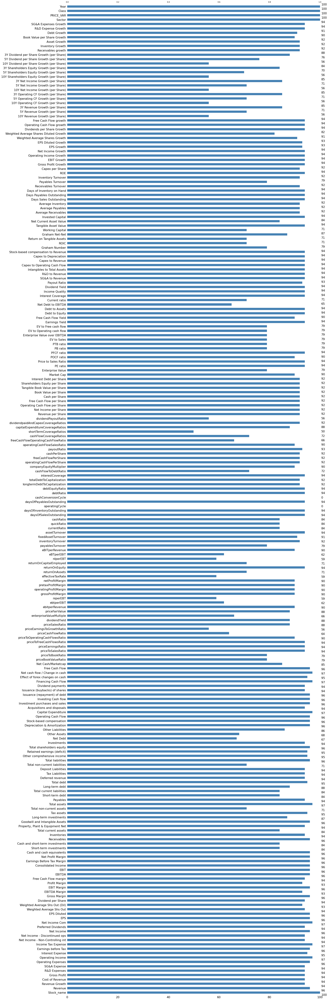

In [ ]:
#Percentage of full values ​​in each column
msno.bar(df.sample(100),color='steelblue') 

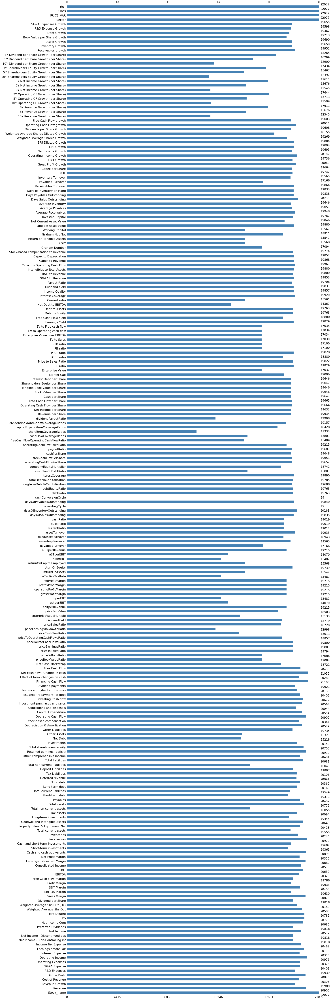

In [ ]:
#The number of full values ​​in each of the columns 
p=msno.bar(df,color='steelblue')

In [ ]:
#A table that shows the number of missing values ​​in each column and their percentage of the total data
data_info=pd.DataFrame(df.dtypes).T.rename(index={0:'column type'})
data_info=data_info.append(pd.DataFrame(df.isnull().sum()).T.rename(index={0:'null values (nb)'}))
data_info=data_info.append(pd.DataFrame(df.isnull().sum()/df.shape[0]*100).T.rename(index={0:'null values (%)'}))
display(data_info)

,Stock_name,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income - Non-Controlling int,Net Income - Discontinued ops,Net Income,Preferred Dividends,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Dividend per Share,Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Short-term investments,Cash and short-term investments,Receivables,Inventories,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Long-term investments,Tax assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Deferred revenue,Tax Liabilities,Deposit Liabilities,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Acquisitions and disposals,Investment purchases and sales,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Dividend payments,Financing Cash Flow,Effect of forex changes on cash,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceEarningsToGrowthRatio,priceSalesRatio,dividendYield,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,operatingProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,inventoryTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfSalesOutstanding,daysOfInventoryOutstanding,operatingCycle,daysOfPayablesOutstanding,cashConversionCycle,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,payoutRatio,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,shortTermCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,dividendPayoutRatio,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,Dividend Yield,Payout Ratio,SG&A to Revenue,R&D to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Average Inventory,Days Sales Outstanding,Days Payables Outstanding,Days of Inventory on Hand,Receivables Turnover,Payables Turnover,Inventory Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Dividends per Share Growth,Operating Cash Flow growth,Free Cash Flow growth,10Y Revenue Growth (per Share),5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),10Y Operating CF Growth (per S

In [ ]:
#A table that shows the number of zero values ​​in each column and their percentage of the total data
data_info=pd.DataFrame(df.dtypes).T.rename(index={0:'column type'})
data_info=data_info.append(pd.DataFrame(df.isin([0]).sum()).T.rename(index={0:'zero values (nb)'}))
data_info=data_info.append(pd.DataFrame(df.isin([0]).sum()/df.shape[0]*100).T.rename(index={0:'zero values (%)'}))
display(data_info)

,Stock_name,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income - Non-Controlling int,Net Income - Discontinued ops,Net Income,Preferred Dividends,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Dividend per Share,Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Short-term investments,Cash and short-term investments,Receivables,Inventories,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Long-term investments,Tax assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Deferred revenue,Tax Liabilities,Deposit Liabilities,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Acquisitions and disposals,Investment purchases and sales,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Dividend payments,Financing Cash Flow,Effect of forex changes on cash,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceEarningsToGrowthRatio,priceSalesRatio,dividendYield,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,operatingProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,inventoryTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfSalesOutstanding,daysOfInventoryOutstanding,operatingCycle,daysOfPayablesOutstanding,cashConversionCycle,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,payoutRatio,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,shortTermCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,dividendPayoutRatio,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,Dividend Yield,Payout Ratio,SG&A to Revenue,R&D to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Average Inventory,Days Sales Outstanding,Days Payables Outstanding,Days of Inventory on Hand,Receivables Turnover,Payables Turnover,Inventory Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Dividends per Share Growth,Operating Cash Flow growth,Free Cash Flow growth,10Y Revenue Growth (per Share),5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),10Y Operating CF Growth (per S

***Conclusion***

There are columns with many 0 values ​​sometimes even in places where it does not make sense to have 0
We assume that some of the zero values ​​are probably empty values ​​filled with a default value of 0

In [ ]:
#check number of unique values in each column
df.nunique()    

Stock_name                                    22077
Revenue                                       19417
Revenue Growth                                 8231
Cost of Revenue                               15549
Gross Profit                                  19223
R&D Expenses                                   7008
SG&A Expense                                  18669
Operating Expenses                            19518
Operating Income                              19793
Interest Expense                              11866
Earnings before Tax                           19605
Income Tax Expense                            14308
Net Income - Non-Controlling int               4755
Net Income - Discontinued ops                  2172
Net Income                                    19073
Preferred Dividends                            1847
Net Income Com                                19170
EPS                                            4139
EPS Diluted                                    4109
Weighted Ave

***Conclusion***

in 'operatingProfitMargin' column we have just one value --> I.e. variance 0 

it will not help us in our model

In [ ]:
#Info about the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22077 entries, 0 to 4391
Columns: 226 entries, Stock_name to Year
dtypes: float64(222), int64(2), object(2)
memory usage: 38.2+ MB


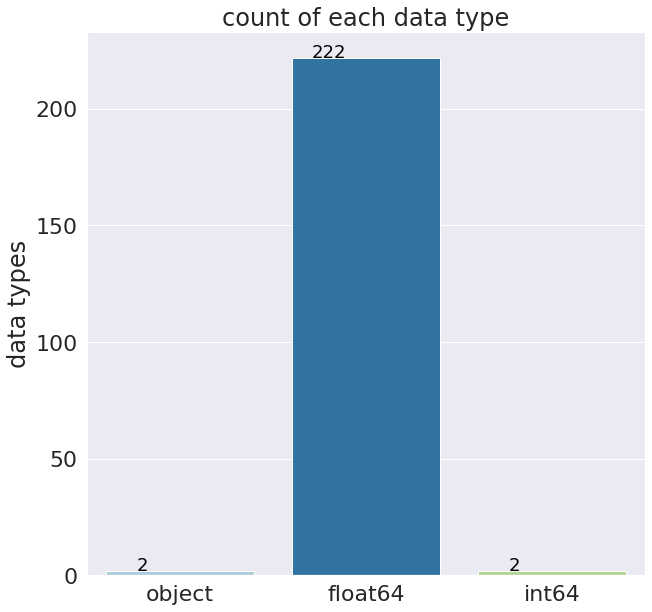

In [ ]:
#Data Type Counting Chart
plt.figure(figsize=(10,10))
sns.set(font_scale=2)
ax = sns.countplot(x=df.dtypes.map(str),palette='Paired')
ax.set_title("count of each data type")
plt.ylabel("data types")
for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.2, p.get_height()),ha='center',  va='baseline', color='black', size=18)
plt.show()



In [ ]:
#DataFrame columns name
df.columns

Index(['Stock_name', 'Revenue', 'Revenue Growth', 'Cost of Revenue',
       'Gross Profit', 'R&D Expenses', 'SG&A Expense', 'Operating Expenses',
       'Operating Income', 'Interest Expense',
       ...
       'Inventory Growth', 'Asset Growth', 'Book Value per Share Growth',
       'Debt Growth', 'R&D Expense Growth', 'SG&A Expenses Growth', 'Sector',
       'PRICE_VAR', 'Class', 'Year'],
      dtype='object', length=226)

In [ ]:
#Describe
df.describe()

,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income - Non-Controlling int,Net Income - Discontinued ops,Net Income,Preferred Dividends,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Dividend per Share,Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Short-term investments,Cash and short-term investments,Receivables,Inventories,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Long-term investments,Tax assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Deferred revenue,Tax Liabilities,Deposit Liabilities,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Acquisitions and disposals,Investment purchases and sales,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Dividend payments,Financing Cash Flow,Effect of forex changes on cash,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceEarningsToGrowthRatio,priceSalesRatio,dividendYield,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,operatingProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,inventoryTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfSalesOutstanding,daysOfInventoryOutstanding,operatingCycle,daysOfPayablesOutstanding,cashConversionCycle,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,payoutRatio,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,shortTermCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,dividendPayoutRatio,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,Dividend Yield,Payout Ratio,SG&A to Revenue,R&D to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Average Inventory,Days Sales Outstanding,Days Payables Outstanding,Days of Inventory on Hand,Receivables Turnover,Payables Turnover,Inventory Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Dividends per Share Growth,Operating Cash Flow growth,Free Cash Flow growth,10Y Revenue Growth (per Share),5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),10Y Operating CF Growth (per Share),5Y Op

***Conclusions***

*   Some financial indicators show a large gap between the maximum value and the 75th percentile value.
*   Large standard deviation values in each of the features
*   Small average compared to the maximum value - the average is sensitive to outliers

All of these signal to us that probably our data contains a lot of outliers

#T TEST 💹


**Search for significant features among the stocks that have risen and fallen**

In [ ]:
#Creating a data frame of the stocks that went up
UpStocks=df[df.Class==1]
UpStocks.head(2)

,Stock_name,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income - Non-Controlling int,Net Income - Discontinued ops,Net Income,Preferred Dividends,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Dividend per Share,Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Short-term investments,Cash and short-term investments,Receivables,Inventories,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Long-term investments,Tax assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Deferred revenue,Tax Liabilities,Deposit Liabilities,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Acquisitions and disposals,Investment purchases and sales,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Dividend payments,Financing Cash Flow,Effect of forex changes on cash,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceEarningsToGrowthRatio,priceSalesRatio,dividendYield,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,operatingProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,inventoryTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfSalesOutstanding,daysOfInventoryOutstanding,operatingCycle,daysOfPayablesOutstanding,cashConversionCycle,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,payoutRatio,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,shortTermCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,dividendPayoutRatio,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,Dividend Yield,Payout Ratio,SG&A to Revenue,R&D to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Average Inventory,Days Sales Outstanding,Days Payables Outstanding,Days of Inventory on Hand,Receivables Turnover,Payables Turnover,Inventory Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Dividends per Share Growth,Operating Cash Flow growth,Free Cash Flow growth,10Y Revenue Growth (per Share),5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),10Y Operating CF Growth (per S

In [ ]:
#Creating a data frame of the stocks that falling down
DownStocks=df[df.Class==0]
DownStocks.head(2)

,Stock_name,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income - Non-Controlling int,Net Income - Discontinued ops,Net Income,Preferred Dividends,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Dividend per Share,Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Short-term investments,Cash and short-term investments,Receivables,Inventories,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Long-term investments,Tax assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Deferred revenue,Tax Liabilities,Deposit Liabilities,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Acquisitions and disposals,Investment purchases and sales,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Dividend payments,Financing Cash Flow,Effect of forex changes on cash,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceEarningsToGrowthRatio,priceSalesRatio,dividendYield,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,operatingProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,inventoryTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfSalesOutstanding,daysOfInventoryOutstanding,operatingCycle,daysOfPayablesOutstanding,cashConversionCycle,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,payoutRatio,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,shortTermCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,dividendPayoutRatio,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,Dividend Yield,Payout Ratio,SG&A to Revenue,R&D to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Average Inventory,Days Sales Outstanding,Days Payables Outstanding,Days of Inventory on Hand,Receivables Turnover,Payables Turnover,Inventory Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Dividends per Share Growth,Operating Cash Flow growth,Free Cash Flow growth,10Y Revenue Growth (per Share),5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),10Y Operating CF Growth (per S

In [ ]:
#The mean value of the feature 'Revenue' among the stocks that fell
DownStocks.Revenue.mean()

4392015981.299868

In [ ]:
#The std value of the feature 'Revenue' among the stocks that fell
DownStocks.Revenue.std()

27914671999.49665

In [ ]:
#The mean value of the feature 'Revenue' among the stocks that risen
UpStocks.Revenue.mean()

5787446835.071705

In [ ]:
#The std value of the feature 'Revenue' among the stocks that risen
UpStocks.Revenue.std()

34916183676.86657

In [ ]:
#T-test for 'Revenue' 
t = scipy.stats.ttest_ind(DownStocks.Revenue,UpStocks.Revenue,axis=0,equal_var=True, nan_policy='omit')
t

Ttest_indResult(statistic=-3.139083772585935, pvalue=0.0016971275115868027)

In [ ]:
#Make a list for the results - Down Mean, Up Mean & P-value
revenueList = [DownStocks.Revenue.mean(),UpStocks.Revenue.mean(),t[1]]
revenueList


[4392015981.299868, 5787446835.071705, 0.0016971275115868027]

***Conclusions***

A significant relationship was found between Revenue and stock value so that a high-Revenue company has a higher chance of an increase in its stock value.

In [ ]:
#The mean value of the feature 'Gross Profit' among the stocks that fell
DownStocks['Gross Profit'].mean()

1671270832.877653

In [ ]:
#The mean value of the feature 'Gross Profit' among the stocks that risen
UpStocks['Gross Profit'].mean()

2214740299.6219983

In [ ]:
#T-test for 'Gross Profit' 
t = scipy.stats.ttest_ind(DownStocks['Gross Profit'],UpStocks['Gross Profit'],axis=0,equal_var=True, nan_policy='omit')
t

Ttest_indResult(statistic=-4.472775160154817, pvalue=7.761832927888112e-06)

In [ ]:
#T-test for all the features 
List = []
for column in df.columns[:-4]:
  if column!= 'Stock_name':
    downMean = round(DownStocks[column].mean(),2)
    downStd = round(DownStocks[column].std(),2)
    upMean = round(UpStocks[column].mean(),2)
    upStd = round(UpStocks[column].std(),2)
    featureTtest =  scipy.stats.ttest_ind(DownStocks[column],UpStocks[column],axis=0,equal_var=True, nan_policy='omit')
    columnName = column
    List.append([column,'down mean: '+ str(downMean),'down std: '+str(downStd),'up mean: '+str(upMean),'up std: '+ str(upStd), featureTtest[1]])
List

[['Revenue',
  'down mean: 4392015981.3',
  'down std: 27914671999.5',
  'up mean: 5787446835.07',
  'up std: 34916183676.87',
  0.0016971275115868027],
 ['Revenue Growth',
  'down mean: 5.8',
  'down std: 443.54',
  'up mean: 1.82',
  'up std: 125.83',
  0.3697684612699903],
 ['Cost of Revenue',
  'down mean: 2758810884.42',
  'down std: 21577910415.98',
  'up mean: 3671566331.22',
  'up std: 28871181557.48',
  0.01219807960868838],
 ['Gross Profit',
  'down mean: 1671270832.88',
  'down std: 8722709927.78',
  'up mean: 2214740299.62',
  'up std: 8739169842.93',
  7.761832927888112e-06],
 ['R&D Expenses',
  'down mean: 74132571.89',
  'down std: 543792907.28',
  'up mean: 127558261.31',
  'up std: 911849506.02',
  9.88535591125092e-07],
 ['SG&A Expense',
  'down mean: 731127757.29',
  'down std: 3749252469.57',
  'up mean: 984539192.53',
  'up std: 3845523605.87',
  2.1648446888252163e-06],
 ['Operating Expenses',
  'down mean: 1205048851.27',
  'down std: 5986571400.17',
  'up mean: 

In [ ]:
#We have 2221 features
len(List)

221

In [ ]:
#Number of significant features --> 82
num=0
for feature in List:
  if feature[5]<0.05:
    print(feature)
    num+=1
print('________________\n' + str(num) + ' Significant features')

['Revenue', 'down mean: 4392015981.3', 'down std: 27914671999.5', 'up mean: 5787446835.07', 'up std: 34916183676.87', 0.0016971275115868027]
['Cost of Revenue', 'down mean: 2758810884.42', 'down std: 21577910415.98', 'up mean: 3671566331.22', 'up std: 28871181557.48', 0.01219807960868838]
['Gross Profit', 'down mean: 1671270832.88', 'down std: 8722709927.78', 'up mean: 2214740299.62', 'up std: 8739169842.93', 7.761832927888112e-06]
['R&D Expenses', 'down mean: 74132571.89', 'down std: 543792907.28', 'up mean: 127558261.31', 'up std: 911849506.02', 9.88535591125092e-07]
['SG&A Expense', 'down mean: 731127757.29', 'down std: 3749252469.57', 'up mean: 984539192.53', 'up std: 3845523605.87', 2.1648446888252163e-06]
['Operating Expenses', 'down mean: 1205048851.27', 'down std: 5986571400.17', 'up mean: 1503426897.03', 'up std: 5378424419.82', 0.00018160176667691505]
['Operating Income', 'down mean: 468671626.89', 'down std: 2896147897.94', 'up mean: 687974227.99', 'up std: 3036682005.76', 1

In these features there **is a clear difference** between the stocks that have risen and those that have fallen

In [ ]:
#Number of features that are not significant --> 138
num=0
for feature in List:
  if feature[5]>0.05:
    print(feature)
    num+=1
print('________________\n' + str(num) + ' Significant features')

['Revenue Growth', 'down mean: 5.8', 'down std: 443.54', 'up mean: 1.82', 'up std: 125.83', 0.3697684612699903]
['Income Tax Expense', 'down mean: 111743981.4', 'down std: 914313877.58', 'up mean: 145020039.3', 'up std: 10717088424.03', 0.7659463295710873]
['Net Income - Non-Controlling int', 'down mean: 12942378.44', 'down std: 158924461.41', 'up mean: 13762132.23', 'up std: 129808747.19', 0.6894043913034333]
['Net Income - Discontinued ops', 'down mean: -3391424.53', 'down std: 286020659.62', 'up mean: -3114724.65', 'up std: 199230393.91', 0.9362605930655851]
['Preferred Dividends', 'down mean: 4374603.41', 'down std: 44829914.76', 'up mean: 4922657.14', 'up std: 59409131.09', 0.47102248211818365]
['EPS', 'down mean: -23351.19', 'down std: 1334803.49', 'up mean: -255.95', 'up std: 29306.92', 0.06455999282780843]
['EPS Diluted', 'down mean: -23521.76', 'down std: 1334118.43', 'up mean: -271.05', 'up std: 29248.41', 0.06252048069448782]
['Weighted Average Shs Out', 'down mean: 26587307

In these features there is **no** significant difference between the stocks that have risen and those that have fallen

# **Data Prep'**  📈

In [ ]:
#Creating a copy
df_cp = df.copy()


In [ ]:
#Dropping the column with variance 0
df_cp.drop(['operatingProfitMargin'],axis=1,inplace=True)

###Drop missing Values

**dynamic** way - rows and columns that have more than 40% missing Values

In [ ]:
print(df.shape)

(22077, 226)


In [ ]:
df_cp.dropna(how='any',axis=1, thresh=df_cp.shape[0]*0.6, inplace=True)
df_cp.dropna(how='any',axis=0, thresh=df_cp.shape[1]*0.6, inplace=True)

print(df_cp.shape)


(19758, 215)


We were left with 215 columns instead of 226 and 19,758 rows instead of 22,077

▶ We deleted 11 columns and 2,319 rows

###Drop zero Values

**dynamic** way - rows and columns that have more than 40% zero Values except Class column

In [ ]:
df_cp_columns=list(df_cp.columns)

In [ ]:
# Count number of zeros in all columns of Dataframe and drop the columns with more than 40% zeros values, except Class column
num=0
for column_name in df_cp.columns:
    column = df_cp[column_name]
    # Get the count of Zeros in column 
    count = (column == 0).sum()
    print('Count of zeros in column ', column_name, ' is : ', count,', percent : ',round(count/df_cp.shape[0]*100),'%')
    if (round(count/df_cp.shape[0]*100) >= 40) & (column_name !='Class') :
      df_cp.drop(column_name,axis=1,inplace=True)
      print('________________drop before_______________')
      num+=1
print('number of columns that we drop: ',num) 

Count of zeros in column  Stock_name  is :  0 , percent :  0 %
Count of zeros in column  Revenue  is :  904 , percent :  5 %
Count of zeros in column  Revenue Growth  is :  989 , percent :  5 %
Count of zeros in column  Cost of Revenue  is :  4298 , percent :  22 %
Count of zeros in column  Gross Profit  is :  884 , percent :  4 %
Count of zeros in column  R&D Expenses  is :  12506 , percent :  63 %
________________drop before_______________
Count of zeros in column  SG&A Expense  is :  487 , percent :  2 %
Count of zeros in column  Operating Expenses  is :  46 , percent :  0 %
Count of zeros in column  Operating Income  is :  10 , percent :  0 %
Count of zeros in column  Interest Expense  is :  5051 , percent :  26 %
Count of zeros in column  Earnings before Tax  is :  10 , percent :  0 %
Count of zeros in column  Income Tax Expense  is :  2687 , percent :  14 %
Count of zeros in column  Net Income - Non-Controlling int  is :  13252 , percent :  67 %
________________drop before_______

In [ ]:
print(df_cp.shape)  

(19758, 184)



▶ We drop 31 columns during the cleaning of zero values












In [ ]:
#Creating a data frame of rows with Null values
missing= df_cp.isnull()
missing.shape

(19758, 184)

In [ ]:
df_cp.shape

(19758, 184)

There are no rows that have all the values even after cleaning

In [ ]:
#Splitting the 'Class' column from the data
df_class = df_cp.Class
df_cp.drop('Class',axis=1,inplace=True)


In [ ]:
#Replace the zero values to NULL in the possible places in order to fill them in using KNN
num=0
for column_name in df_cp_columns:
    if (column_name != 'revenue Growth') & (column_name != 'EPS') & (column_name != 'Profit Margin') & (column_name != 'Receivables') & (column_name != 'dividendpaidAndCapexCoverageRatios') & (column_name != 'Operating Income Growth') & (column_name != 'Net Income Growth') & (column_name != 'Receivables growth') :
      df_cp.replace(0.00000,np.nan,inplace=True)
      num+=1
print('number of columns that we change: ',num) 

number of columns that we change:  208


In [ ]:
#df_cp.replace(0.00000,np.nan,inplace=True)

In [ ]:
#Turning the sector column into a dummy variable
sector_df = pd.get_dummies(df_cp.Sector, drop_first=True)

In [ ]:
sector_df.head(2)

,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities
0,0,0,1,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0


In [ ]:
df_cp = pd.concat([df_cp, sector_df], axis=1)
df_cp.head(2)


,Stock_name,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,Sector,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities
0,PG14,74401000000.00000,-0.07130,39030000000.00000,35371000000.00000,21461000000.00000,21461000000.00000,13910000000.00000,709000000.00000,14494000000.00000,2851000000.00000,11643000000.00000,11643000000.00000,4.19000,4.01000,2705960276.00000,2705960276.0

In [ ]:
#Dropping the 'sector' column
df_cp.drop(['Sector'], inplace=True, axis=1)

In [ ]:
df_cp= pd.concat([df_cp, df_class], axis=1)
df_cp.head(2)

,Stock_name,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
0,PG14,74401000000.00000,-0.07130,39030000000.00000,35371000000.00000,21461000000.00000,21461000000.00000,13910000000.00000,709000000.00000,14494000000.00000,2851000000.00000,11643000000.00000,11643000000.00000,4.19000,4.01000,2705960276.00000,2705960276.00

In [ ]:
df_cp.tail(2)

,Stock_name,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
4390,ZOM18,NaN,NaN,NaN,NaN,4521349.00000,16648628.00000,-16648628.00000,NaN,-16647687.00000,NaN,-16647687.00000,-16647687.00000,-0.18000,-0.18000,94796209.00000,93440341.00000,NaN,NaN,NaN,NaN,NaN,-16441920.00000,-16647687.00000,-16647687.00000,NaN,NaN,19402

###Filling with KNN - 1 neighbors


In [ ]:
df_cp.isna().any(axis=1).sum() #NULL VALUES

19350

In [ ]:
#Save the stock names in a list. KNN can't contain string column
nameIndex = pd.Series(list(df_cp.Stock_name))
df_cp.drop(['Stock_name'],axis=1,inplace=True)

In [ ]:
imputer = KNNImputer(n_neighbors=1, weights='distance', metric='nan_euclidean', copy=True)  #Checked until 10

In [ ]:
##Filling action
df_cp_clean =imputer.fit_transform(df_cp)

In [ ]:
df_cp_clean = pd.DataFrame(df_cp_clean)
df_cp_clean.columns = list(df_cp)

In [ ]:
df_cp_clean.set_index(nameIndex,inplace=True)

In [ ]:
df_cp_clean.isna().any(axis=1).sum() 

0

No more NULL values

In [ ]:
df_cp_clean.head(2)

,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
PG14,74401000000.00000,-0.07130,39030000000.00000,35371000000.00000,21461000000.00000,21461000000.00000,13910000000.00000,709000000.00000,14494000000.00000,2851000000.00000,11643000000.00000,11643000000.00000,4.19000,4.01000,2705960276.00000,2705960276.00000,0.47540,0

In [ ]:
df_cp_clean.tail(2)

,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
ZOM18,745403.57410,-0.03480,424559.19580,320844.37830,4521349.00000,16648628.00000,-16648628.00000,254355.91960,-16647687.00000,-356956.00000,-16647687.00000,-16647687.00000,-0.18000,-0.18000,94796209.00000,93440341.00000,0.43040,-5.00370,-6.71990,-5.25760,-5.15520,-1

In [ ]:
df_cp_clean.isnull().sum()

Revenue                                      0
Revenue Growth                               0
Cost of Revenue                              0
Gross Profit                                 0
SG&A Expense                                 0
Operating Expenses                           0
Operating Income                             0
Interest Expense                             0
Earnings before Tax                          0
Income Tax Expense                           0
Net Income                                   0
Net Income Com                               0
EPS                                          0
EPS Diluted                                  0
Weighted Average Shs Out                     0
Weighted Average Shs Out (Dil)               0
Gross Margin                                 0
EBITDA Margin                                0
EBIT Margin                                  0
Profit Margin                                0
Free Cash Flow margin                        0
EBITDA       

In [ ]:
df_cp_clean.duplicated().sum()

0

In [ ]:
df_cp.describe()- df.describe()

,10Y Dividend per Share Growth (per Share),10Y Net Income Growth (per Share),10Y Operating CF Growth (per Share),10Y Revenue Growth (per Share),10Y Shareholders Equity Growth (per Share),3Y Dividend per Share Growth (per Share),3Y Net Income Growth (per Share),3Y Operating CF Growth (per Share),3Y Revenue Growth (per Share),3Y Shareholders Equity Growth (per Share),5Y Dividend per Share Growth (per Share),5Y Net Income Growth (per Share),5Y Operating CF Growth (per Share),5Y Revenue Growth (per Share),5Y Shareholders Equity Growth (per Share),Acquisitions and disposals,Asset Growth,Average Inventory,Average Payables,Average Receivables,Book Value per Share,Book Value per Share Growth,Capex per Share,Capex to Depreciation,Capex to Operating Cash Flow,Capex to Revenue,Capital Expenditure,Cash and cash equivalents,Cash and short-term investments,Cash per Share,Class,Communication Services,Consolidated Income,Consumer Cyclical,Consumer Defensive,Cost of Revenue,Current ratio,Days Payables Outstanding,Days Sales Outstanding,Days of Inventory on Hand,Debt Growth,Debt to Assets,Debt to Equity,Deferred revenue,Deposit Liabilities,Depreciation & Amortization,Dividend Yield,Dividend payments,Dividend per Share,Dividends per Share Growth,EBIT,EBIT Growth,EBIT Margin,EBITDA,EBITDA Margin,EPS,EPS Diluted,EPS Diluted Growth,EPS Growth,EV to Free cash flow,EV to Operating cash flow,EV to Sales,Earnings Before Tax Margin,Earnings Yield,Earnings before Tax,Effect of forex changes on cash,Energy,Enterprise Value,Enterprise Value over EBITDA,Financial Services,Financing Cash Flow,Free Cash Flow,Free Cash Flow Yield,Free Cash Flow growth,Free Cash Flow margin,Free Cash Flow per Share,Goodwill and Intangible Assets,Graham Net-Net,Graham Number,Gross Margin,Gross Profit,Gross Profit Growth,Healthcare,Income Quality,Income Tax Expense,Industrials,Intangibles to Total Assets,Interest Coverage,Interest Debt per Share,Interest Expense,Inventories,Inventory Growth,Inventory Turnover,Invested Capital,Investing Cash flow,Investment purchases and sales,Investments,Issuance (buybacks) of shares,Issuance (repayment) of debt,Long-term debt,Long-term investments,Market Cap,Net Cash/Marketcap,Net Current Asset Value,Net Debt,Net Debt to EBITDA,Net Income,Net Income - Discontinued ops,Net Income - Non-Controlling int,Net Income Com,Net Income Growth,Net Income per Share,Net Profit Margin,Net cash flow / Change in cash,Operating Cash Flow,Operating Cash Flow growth,Operating Cash Flow per Share,Operating Expenses,Operating Income,Operating Income Growth,Other Assets,Other Liabilities,Other comprehensive income,PB ratio,PE ratio,PFCF ratio,POCF ratio,PRICE_VAR,PTB ratio,Payables,Payables Turnover,Payout Ratio,Preferred Dividends,Price to Sales Ratio,Profit Margin,"Property, Plant & Equipment Net",R&D Expense Growth,R&D Expenses,R&D to Revenue,ROE,ROIC,Real Estate,Receivables,Receivables Turnover,Receivables growth,Retained earnings (deficit),Return on Tangible Assets,Revenue,Revenue Growth,Revenue per Share,SG&A Expense,SG&A Expenses Growth,SG&A to Revenue,Shareholders Equity per Share,Short-term debt,Short-term investments,Stock-based compensation,Stock-based compensation to Revenue,Tangible Asset Value,Tangible Book Value per Share,Tax Liabilities,Tax assets,Technology,Total assets,Total current assets,Total current liabilities,Total debt,Total liabilities,Total non-current assets,Total non-current liabilities,Total shareholders equity,Utilities,Weighted Average Shares Diluted Growth,Weighted Average Shares Growth,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Working Capital,Year,assetTurnover,capitalExpenditureCoverageRatios,cashConversionCycle,cashFlowCoverageRatios,cashFlowToDebtRatio,cashPerShare,cashRatio,companyEquityMultiplier,currentRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,daysOfSalesOutstanding,debtEquityRatio,debtRatio,dividendPayoutRatio,dividendYield,dividendpaidAndCapexCoverageRatios,eBITperRevenue,eBTperEBIT,ebitperReven

##Outliers 

In [ ]:
cols = df_cp_clean.columns #Save the column names in a separate list

Q1 = df_cp_clean[cols].quantile(0.25)
Q3 = df_cp_clean[cols].quantile(0.75)
IQR = Q3 - Q1

df_clean_no_outliers = df_cp_clean[~((df_cp_clean[cols] < (Q1 - 1.5 * IQR)) |(df_cp_clean[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]
len(df_clean_no_outliers) 


21

In [ ]:
df_clean_no_outliers.shape #Small data frame with no outliers

(21, 192)

In [ ]:
#Function for finding outliers in a particular feature
def get_outliers(scaled_df, series):
  q1 = series.quantile(0.25)
  q3 = series.quantile(0.75)

  if q1*q3 == 0:
    iqr = abs(2*(q1+q3))
    toprange = iqr
    botrange = -toprange
  else:
    iqr = q3-q1
    toprange = q3 + iqr * 1.5
    botrange = q1 - iqr * 1.5

  outliers_top=scaled_df[series > toprange]
  outliers_bot= scaled_df[series < botrange]
  outliers = pd.concat([outliers_bot, outliers_top], axis=0)

  return (botrange, toprange, outliers)

In [ ]:
#outliers from '5Y Shareholders Equity Growth (per Share)' column
botrange, toprange, outliers = get_outliers(df_cp_clean, df_cp_clean['5Y Shareholders Equity Growth (per Share)'])
print(toprange)
print(botrange)

outliers.head()

0.337925
-0.273875


,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
KMB14,19724000000.00000,0.00830,13041000000.00000,6683000000.00000,3709000000.00000,4162000000.00000,2521000000.00000,284000000.00000,2382000000.00000,856000000.00000,1526000000.00000,1526000000.00000,4.07000,4.04000,372455181.00000,372455181.00000,0.33880,0.17900,0.1

In [ ]:
#Boxplot for '5Y Shareholders Equity Growth (per Share)' column
fig = go.Figure()
fig.add_trace(go.Box(name='5Y Shareholders Equity Growth (per Share)', y=df_cp_clean['5Y Shareholders Equity Growth (per Share)'], boxmean='sd'))

fig.update_traces(
    marker=dict(
        color='rgb(8,81,156)',
        outliercolor='rgba(219, 64, 82, 0.6)',
        line=dict(
            outliercolor='rgba(219, 64, 82, 0.6)',
            outlierwidth=2)),
    line_color='rgb(8,81,156)'
)
fig.show()

In [ ]:
outliers.shape

(2267, 192)

In [ ]:
no_outliers_df = df_cp_clean[~df_cp_clean.index.isin(outliers.index)]

In [ ]:
no_outliers_df.reset_index(inplace=True, drop=True)

In [ ]:
no_outliers_df.head()

,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
0,74401000000.00000,-0.07130,39030000000.00000,35371000000.00000,21461000000.00000,21461000000.00000,13910000000.00000,709000000.00000,14494000000.00000,2851000000.00000,11643000000.00000,11643000000.00000,4.19000,4.01000,2705960276.00000,2705960276.00000,0.47540,0.24

In [ ]:
no_outliers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17491 entries, 0 to 17490
Columns: 192 entries, Revenue to Class
dtypes: float64(192)
memory usage: 25.6 MB


In [ ]:
df_cp_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19758 entries, PG14 to ZYME18
Columns: 192 entries, Revenue to Class
dtypes: float64(192)
memory usage: 29.1+ MB


**After dropping the outliers of feature '5Y Shareholders Equity Growth (per Share)' left 8152 compared to 19758**


In [ ]:
#outliers from 'Asset Growth' column
botrange, toprange, outliers = get_outliers(df_cp_clean, df_cp_clean['Asset Growth'])
print(toprange)
print(botrange)

outliers.head()

0.491675
-0.344125


,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
CLF14,3373200000.00000,-0.13300,2487500000.00000,885700000.00000,154700000.00000,790200000.00000,95500000.00000,176700000.00000,-7310200000.00000,-86000000.00000,-7224200000.00000,-7275400000.00000,-47.52000,-47.52000,153195289.00000,153098000.00000,0.26260,-1.96500,-

In [ ]:
#Boxplot for 'Asset Growth' column
fig = go.Figure()
fig.add_trace(go.Box(name='Asset Growth', y=df_cp_clean['Asset Growth'], boxmean='sd'))

fig.update_traces(
    marker=dict(
        color='rgb(8,81,156)',
        outliercolor='rgba(219, 64, 82, 0.6)',
        line=dict(
            outliercolor='rgba(219, 64, 82, 0.6)',
            outlierwidth=2)),
    line_color='rgb(8,81,156)'
)
fig.show()

In [ ]:
outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2828 entries, CLF14 to ZYME18
Columns: 192 entries, Revenue to Class
dtypes: float64(192)
memory usage: 4.2+ MB


In [ ]:
no_outliers_df = df_cp_clean[~df_cp_clean.index.isin(outliers.index)]

In [ ]:
no_outliers_df.reset_index(inplace=True, drop=True)


In [ ]:
no_outliers_df.shape

(16930, 192)

In [ ]:
df_cp_clean.shape

(19758, 192)

**After dropping the outliers of feature 'Asset Growth' left 10500 compared to 19758**


In [ ]:
#outliers from 'assetTurnover' column
botrange, toprange, outliers = get_outliers(df_cp_clean, df_cp_clean['assetTurnover'])
print(toprange)
print(botrange)

outliers.head()

2.212211272050758
-1.0957633352982228


,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
KR14,98375000000.00000,0.01820,78138000000.00000,20237000000.00000,15196000000.00000,17512000000.00000,2725000000.00000,443000000.00000,2270000000.00000,751000000.00000,1519000000.00000,1519000000.00000,1.47000,1.45000,1033052512.00000,1028000000.00000,0.20570,0.04500

In [ ]:
#Boxplot for 'assetTurnover' column
fig = go.Figure()
fig.add_trace(go.Box(name='assetTurnover', y=df_cp_clean['assetTurnover'], boxmean='sd'))

fig.update_traces(
    marker=dict(
        color='rgb(8,81,156)',
        outliercolor='rgba(219, 64, 82, 0.6)',
        line=dict(
            outliercolor='rgba(219, 64, 82, 0.6)',
            outlierwidth=2)),
    line_color='rgb(8,81,156)'
)
fig.show()

In [ ]:
outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 799 entries, KR14 to TZOO18
Columns: 192 entries, Revenue to Class
dtypes: float64(192)
memory usage: 1.2+ MB


In [ ]:
no_outliers_df = df_cp_clean[~df_cp_clean.index.isin(outliers.index)]

In [ ]:
no_outliers_df.reset_index(inplace=True, drop=True)


In [ ]:
no_outliers_df.shape

(18959, 192)

In [ ]:
df_cp_clean.shape

(19758, 192)

**After dropping the outliers of feature 'assetTurnover' left 16170 compared to 19758**


In [ ]:
#outliers from 'Free Cash Flow Yield' column
botrange, toprange, outliers = get_outliers(df_cp_clean, df_cp_clean['Free Cash Flow Yield'])
print(toprange)
print(botrange)

outliers.head()

0.24875
-0.21965


,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
CECO14,913964000.00000,-0.10150,323259000.00000,590705000.00000,640454000.00000,729977000.00000,-139272000.00000,491000.00000,-174427000.00000,3736000.00000,-178163000.00000,-178163000.00000,-2.65000,-2.65000,67278590.00000,67173000.00000,0.64630,-0.13000,-0.19030,-0.

In [ ]:
#Boxplot for 'Free Cash Flow Yield' column
fig = go.Figure()
fig.add_trace(go.Box(name='Free Cash Flow Yield', y=df_cp_clean['Free Cash Flow Yield'], boxmean='sd'))

fig.update_traces(
    marker=dict(
        color='rgb(8,81,156)',
        outliercolor='rgba(219, 64, 82, 0.6)',
        line=dict(
            outliercolor='rgba(219, 64, 82, 0.6)',
            outlierwidth=2)),
    line_color='rgb(8,81,156)'
)
fig.show()

In [ ]:
#Finding the very extreme value
maxOutlier=df_cp_clean['Free Cash Flow Yield'].min()

In [ ]:
#Save his record
rslt_df = df_cp_clean[df_cp_clean['Free Cash Flow Yield'] == maxOutlier]

In [ ]:
#his value
maxOutlier

-25896.7081

In [ ]:
rslt_df

,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
GNL14,93383000.00000,22.63530,8744000.00000,84639000.00000,4314000.00000,128199000.00000,-43560000.00000,14852000.00000,-55025000.00000,-1431000.00000,-53594000.00000,-53594000.00000,-1.29000,-1.29000,58941005.00000,42026414.00000,0.90640,0.00200,-0.43020,-0.57400,-16

In [ ]:
#Finding his index
index_drop=rslt_df.index[0]
index_drop

'GNL14'

In [ ]:
#dropping this column
df_cp_clean.drop(index_drop,axis=0,inplace=True)

In [ ]:
#Box plot after dropping the extreme value
fig = go.Figure()
fig.add_trace(go.Box(name='Free Cash Flow Yield', y=df_cp_clean['Free Cash Flow Yield'], boxmean='sd'))

fig.update_traces(
    marker=dict(
        color='rgb(8,81,156)',
        outliercolor='rgba(219, 64, 82, 0.6)',
        line=dict(
            outliercolor='rgba(219, 64, 82, 0.6)',
            outlierwidth=2)),
    line_color='rgb(8,81,156)'
)
fig.show()

In [ ]:
outliers.shape

(2778, 192)

In [ ]:
no_outliers_df = df_cp_clean[~df_cp_clean.index.isin(outliers.index)]

In [ ]:
no_outliers_df.reset_index(inplace=True, drop=True)


In [ ]:
no_outliers_df.shape

(16980, 192)

**After dropping the outliers of feature 'assetTurnover' left 9422 compared to 19758**

##**correlation**

In [ ]:
corr=df_cp_clean.corr()
corr


,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
Revenue,1.00000,-0.00335,0.95093,0.80897,0.70970,0.78899,0.62607,0.42566,0.63912,0.51196,0.59993,0.59725,0.00303,0.00305,0.31283,0.30566,-0.02901,0.01182,0.01132,0.01198,0.01046,0.77000,0.66754,0.61234,0.01139,0.01129,0.23109,0.19863,0.44866,0.26168,0.69617,0.44940,-0

In [ ]:
## Column printing with high correlation between them (above 0.85)
for i in range(len(corr.columns)-1):
  print(corr.columns[i], 'is correlated to: ')
  for j in range(len(corr.columns)-1):
    if abs(corr.iloc[i,j])>=0.85 and i is not j:
      print(corr.columns[j], end=', ')
  print('\n----------------------')


Revenue is correlated to: 
Cost of Revenue, 
----------------------
Revenue Growth is correlated to: 
Gross Profit Growth, 
----------------------
Cost of Revenue is correlated to: 
Revenue, 
----------------------
Gross Profit is correlated to: 
SG&A Expense, Operating Expenses, EBITDA, 
----------------------
SG&A Expense is correlated to: 
Gross Profit, Operating Expenses, 
----------------------
Operating Expenses is correlated to: 
Gross Profit, SG&A Expense, 
----------------------
Operating Income is correlated to: 
Earnings before Tax, Net Income, EBITDA, EBIT, Consolidated Income, 
----------------------
Interest Expense is correlated to: 

----------------------
Earnings before Tax is correlated to: 
Operating Income, Net Income, Net Income Com, EBITDA, EBIT, Consolidated Income, 
----------------------
Income Tax Expense is correlated to: 

----------------------
Net Income is correlated to: 
Operating Income, Earnings before Tax, Net Income Com, EBITDA, EBIT, Consolidated I

הפיצ'ר תזרים מזומנים של חברה הוא בעל קורלציה חזקה למשתנה התלוי שלנו (ערך המניה)

### HEATMAP

In [ ]:
fig = go.Figure(data=go.Heatmap(
                   z=corr.corr(),
                   x=corr.columns,
                   y=corr.columns,
                   hoverongaps = True))
fig.update_layout(
    width=1500
)
fig.show()



---


Deleting one of the columns that is correlated with another variable
In this operation we considered in short the target variable and chose to leave the variable that better explains the dependent variable

In [ ]:
corr.drop(labels=['Cost of Revenue','Gross Profit Growth','Revenue','SG&A Expense','Operating Expenses','EBITDA','Operating Income'
,'Net Income','EBIT','Consolidated Income','Earnings before Tax','Net Income Com','EPS Diluted'
,'Weighted Average Shs Out','Weighted Average Shs Out (Dil)','EBITDA Margin','EBIT Margin','Profit Margin',
'Gross Profit','Earnings Before Tax Margin','Cash and cash equivalents','EPS','Total assets','Revenue Growth','Receivables','Property, Plant & Equipment Net',
'Total debt','Net Profit Margin','Total non-current liabilities','ebitperRevenue','pretaxProfitMargin','netProfitMargin',
'Total non-current assets','Short-term debt','Investments','Net Debt','eBITperRevenue','Other Assets','Other Liabilities','Depreciation & Amortization',
'Investing Cash flow','Free Cash Flow margin','SG&A to Revenue','Total current liabilities','Tangible Asset Value','Financing Cash Flow',
'Average Receivables','Total current assets','Total liabilities','Goodwill and Intangible Assets','priceToBookRatio','Working Capital'
,'Invested Capital','priceEarningsRatio','Retained earnings (deficit)','Stock-based compensation','Net Cash/Marketcap',
'grossProfitMargin','nIperEBT','Net Current Asset Value','Payables','currentRatio','cashRatio','Interest Expense','Income Tax Expense','priceToOperatingCashFlowsRatio','eBTperEBIT'
,'daysOfInventoryOutstanding','totalDebtToCapitalization','enterpriseValueMultiple','quickRatio','interestCoverage','cashPerShare','freeCashFlowOperatingCashFlowRatio','capitalExpenditureCoverageRatios',
'Revenue per Share','Shareholders Equity per Share','Interest Debt per Share','priceFairValue','debtRatio','operatingCashFlowPerShare','Net Income per Share','Free Cash Flow per Share',
'Book Value per Share','Total shareholders equity','PTB ratio','Capital Expenditure','EV to Operating cash flow','Issuance (buybacks) of shares','returnOnAssets','freeCashFlowPerShare',
'Cash per Share','Price to Sales Ratio','PFCF ratio','EV to Sales','Interest Coverage','Capex to Operating Cash Flow','Stock-based compensation to Revenue','Graham Number','Graham Net-Net','priceBookValueRatio',
'PB ratio','returnOnCapitalEmployed','dividendpaidAndCapexCoverageRatios','PE ratio','Long-term debt','Debt to Assets','Current ratio','Days Payables Outstanding','ROE','Operating Income Growth',
'Cash and short-term investments','Capex to Depreciation','EPS Diluted Growth','Operating Cash Flow growth','priceToSalesRatio','priceToFreeCashFlowsRatio','Asset Growth','Book Value per Share Growth',
'debtEquityRatio','Net Debt to EBITDA','Days Sales Outstanding','Payables Turnover','cashFlowToDebtRatio','cashFlowCoverageRatios','5Y Net Income Growth (per Share)','3Y Revenue Growth (per Share)','niperEBT',
'returnOnEquity','Weighted Average Shares Diluted Growth','Net Income Growth','daysOfPayablesOutstanding','POCF ratio','Net cash flow / Change in cash'], axis=1,inplace=True)

In [ ]:
corr.drop(labels=['Cost of Revenue','Gross Profit Growth','Revenue','SG&A Expense','Operating Expenses','EBITDA','Operating Income'
,'Net Income','EBIT','Consolidated Income','Earnings before Tax','Net Income Com','EPS Diluted'
,'Weighted Average Shs Out','Weighted Average Shs Out (Dil)','EBITDA Margin','EBIT Margin','Profit Margin',
'Gross Profit','Earnings Before Tax Margin','Cash and cash equivalents','EPS','Total assets','Revenue Growth','Receivables','Property, Plant & Equipment Net',
'Total debt','Net Profit Margin','Total non-current liabilities','ebitperRevenue','pretaxProfitMargin','netProfitMargin',
'Total non-current assets','Short-term debt','Investments','Net Debt','eBITperRevenue','Other Assets','Other Liabilities','Depreciation & Amortization',
'Investing Cash flow','Free Cash Flow margin','SG&A to Revenue','Total current liabilities','Tangible Asset Value','Financing Cash Flow',
'Average Receivables','Total current assets','Total liabilities','Goodwill and Intangible Assets','priceToBookRatio','Working Capital'
,'Invested Capital','priceEarningsRatio','Retained earnings (deficit)','Stock-based compensation','Net Cash/Marketcap',
'grossProfitMargin','nIperEBT','Net Current Asset Value','Payables','currentRatio','cashRatio','Interest Expense','Income Tax Expense','priceToOperatingCashFlowsRatio','eBTperEBIT'
,'daysOfInventoryOutstanding','totalDebtToCapitalization','enterpriseValueMultiple','quickRatio','interestCoverage','cashPerShare','freeCashFlowOperatingCashFlowRatio','capitalExpenditureCoverageRatios',
'Revenue per Share','Shareholders Equity per Share','Interest Debt per Share','priceFairValue','debtRatio','operatingCashFlowPerShare','Net Income per Share','Free Cash Flow per Share',
'Book Value per Share','Total shareholders equity','PTB ratio','Capital Expenditure','EV to Operating cash flow','Issuance (buybacks) of shares','returnOnAssets','freeCashFlowPerShare',
'Cash per Share','Price to Sales Ratio','PFCF ratio','EV to Sales','Interest Coverage','Capex to Operating Cash Flow','Stock-based compensation to Revenue','Graham Number','Graham Net-Net','priceBookValueRatio',
'PB ratio','returnOnCapitalEmployed','dividendpaidAndCapexCoverageRatios','PE ratio','Long-term debt','Debt to Assets','Current ratio','Days Payables Outstanding','ROE','Operating Income Growth',
'Cash and short-term investments','Capex to Depreciation','EPS Diluted Growth','Operating Cash Flow growth','priceToSalesRatio','priceToFreeCashFlowsRatio','Asset Growth','Book Value per Share Growth',
'debtEquityRatio','Net Debt to EBITDA','Days Sales Outstanding','Payables Turnover','cashFlowToDebtRatio','cashFlowCoverageRatios','5Y Net Income Growth (per Share)','3Y Revenue Growth (per Share)','niperEBT',
'returnOnEquity','Weighted Average Shares Diluted Growth','Net Income Growth','daysOfPayablesOutstanding','POCF ratio','Net cash flow / Change in cash'], axis=0,inplace=True)

In [ ]:
fig = go.Figure(data=go.Heatmap(
                   z=corr.corr(),
                   x=corr.columns,
                   y=corr.columns,
                   hoverongaps = True))
fig.update_layout(
    width=1500
)
fig.show()

In [ ]:
#Print that has no features with a high correlation between them.
#Avoid multicollinearity
cols = corr.columns.to_list()
for i in range(len(cols)):
  print(cols[i], ': ', end=' ')
  for j in range(len(cols)):
    if abs(corr.iloc[i,j]) >= 0.85 and cols[i] is not cols[j] :
      print(cols[j], end=', ')
  print()

Gross Margin :  
Other comprehensive income :  
Operating Cash Flow :  
Issuance (repayment) of debt :  
Free Cash Flow :  
priceCashFlowRatio :  
priceSalesRatio :  
ebtperEBIT :  
effectiveTaxRate :  
payablesTurnover :  
fixedAssetTurnover :  
assetTurnover :  
longtermDebtToCapitalization :  
companyEquityMultiplier :  
operatingCashFlowSalesRatio :  
Operating Cash Flow per Share :  
Tangible Book Value per Share :  
Market Cap :  
Enterprise Value :  
Enterprise Value over EBITDA :  
EV to Free cash flow :  
Earnings Yield :  
Free Cash Flow Yield :  
Debt to Equity :  
Income Quality :  
Intangibles to Total Assets :  
Capex to Revenue :  
ROIC :  
Return on Tangible Assets :  
Average Payables :  
Receivables Turnover :  
Capex per Share :  
EBIT Growth :  
EPS Growth :  
Weighted Average Shares Growth :  
Free Cash Flow growth :  
5Y Revenue Growth (per Share) :  
5Y Operating CF Growth (per Share) :  
3Y Operating CF Growth (per Share) :  
3Y Net Income Growth (per Share) :  

In [ ]:
#We were left with 58 columns
corr.shape

(58, 58)

In [ ]:
df_cp_clean_afterCorr = df_cp_clean[cols]
len(df_cp_clean_afterCorr)

19757

##normalization - Scale 
using Min-max normalization

In [ ]:
#scaled the DF with Min-Max Scaled
scaler = MinMaxScaler()
scaled_df = pd.DataFrame(scaler.fit_transform(df_cp_clean_afterCorr), columns=df_cp_clean_afterCorr.columns)
scaled_df.head()

,Gross Margin,Other comprehensive income,Operating Cash Flow,Issuance (repayment) of debt,Free Cash Flow,priceCashFlowRatio,priceSalesRatio,ebtperEBIT,effectiveTaxRate,payablesTurnover,fixedAssetTurnover,assetTurnover,longtermDebtToCapitalization,companyEquityMultiplier,operatingCashFlowSalesRatio,Operating Cash Flow per Share,Tangible Book Value per Share,Market Cap,Enterprise Value,Enterprise Value over EBITDA,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Income Quality,Intangibles to Total Assets,Capex to Revenue,ROIC,Return on Tangible Assets,Average Payables,Receivables Turnover,Capex per Share,EBIT Growth,EPS Growth,Weighted Average Shares Growth,Free Cash Flow growth,5Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Debt Growth,SG&A Expenses Growth,PRICE_VAR,Year,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
0,0.95192,0.00005,0.11806,0.59925,0.57640,0.00002,0.00001,0.30309,0.80327,0.00491,0.00087,0.00476,0.02314,0.00000,0.32290,0.35483,0.00000,0.00221,0.29828,0.00037,0.84632,0.44085,0.93332,0.54832,0.13340,0.58873,0.84782,0.31938,0.49997,0.03956,0.00024,0.98317,0.45051,0.32678,0.00000,0.91220,0.10112,0.19311,0.09592,0.05580,0.13336,0.04763,0.00007,0.00007,0.00107,0.00013,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
1,0.94904,0.00006,0.10554,0.57944,0.52676,0.00000,0.00000,0.30309,0.80330,0.00487,0.00089,0.01108,0.02724,0.00000,0.32290,0.35483,0.00000,0.00007,0.11859,0.00031,0.84631,0.44085,0.93332,0.54853,0.13353,0.06994,0.84783,0.31948,0.49919,0.02850,0.00019,0.98317,0.45055,0.32699,0.00000,0.91220,0.11201,0.22730,0.11529,0.07419,0.14771,0.05377,0.00006,0.00008,0.00201,0.00011,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,0.94849,0.00006,0.10838,0.58942,0.53170,0.00001,0.00000,0.30306,0.80340,0.00530,0.00087,0.02591,0.02768,0.00000,0.32290,0.35483,0.00000,0.00019,0.13745,0.00019,0.84632,0.44085,0.93333,0.54866,0.13346,0.09727,0.84782,0.31939,0.49928,0.03419,0.00072,0.98317,0.45051,0.32678,0.00000,0.91220,0.11064,0.21089,0.10234,0.06596,0.13632,0.05043,0.00007,0.00008,0.00117,0.00019,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000
3,0.94952,0.00006,0.10571,0.57324,0.52729,0.00002,0.00000,0.30291,0.80309,0.00530,0.00089,0.02826,0.03785,0.00002,0.32290,0.35483,0.00000,0.00007,0.12415,0.00031,0.84634,0.44085,0.93333,0.54763,0.13350,0.06230,0.84782,0.31940,0.49923,0.02963,0.00034,0.98317,0.45052,0.32691,0.00000,0.91220,0.09733,0.21526,0.11011,0.01366,0.14291,0.13970,0.00007,0.00006,0.00116,0.00015,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000
4,0.95040,0.00005,0.10742,0.58067,0.53494,0.00002,0.00000,0.30307,0.80340,0.00505,0.00087,0.00668,0.02610,0.00000,0.32290,0.35483,0.00000,0.00035,0.14677,0.00032,0.84632,0.44085,0.93333,0.54850,0.13341,0.59315,0.84782,0.31940,0.50004,0.02987,0.00024,0.98317,0.45051,0.32677,0.00000,0.91220,0.10592,0.20878,0.11211,0.05645,0.13726,0.04771,0.00007,0.00007,0.00115,0.00016,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000


,'Communication Services','Consumer Cyclical','Consumer Defensive','Energy',
                    'Financial Services','Healthcare','Industrials','Real Estate','Technology','Utilities'

In [ ]:
X = scaled_df.drop(['Class','PRICE_VAR','Year'], axis=1)
y = scaled_df.Class
X.head()

,Gross Margin,Other comprehensive income,Operating Cash Flow,Issuance (repayment) of debt,Free Cash Flow,priceCashFlowRatio,priceSalesRatio,ebtperEBIT,effectiveTaxRate,payablesTurnover,fixedAssetTurnover,assetTurnover,longtermDebtToCapitalization,companyEquityMultiplier,operatingCashFlowSalesRatio,Operating Cash Flow per Share,Tangible Book Value per Share,Market Cap,Enterprise Value,Enterprise Value over EBITDA,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Income Quality,Intangibles to Total Assets,Capex to Revenue,ROIC,Return on Tangible Assets,Average Payables,Receivables Turnover,Capex per Share,EBIT Growth,EPS Growth,Weighted Average Shares Growth,Free Cash Flow growth,5Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Debt Growth,SG&A Expenses Growth,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities
0,0.95192,0.00005,0.11806,0.59925,0.57640,0.00002,0.00001,0.30309,0.80327,0.00491,0.00087,0.00476,0.02314,0.00000,0.32290,0.35483,0.00000,0.00221,0.29828,0.00037,0.84632,0.44085,0.93332,0.54832,0.13340,0.58873,0.84782,0.31938,0.49997,0.03956,0.00024,0.98317,0.45051,0.32678,0.00000,0.91220,0.10112,0.19311,0.09592,0.05580,0.13336,0.04763,0.00007,0.00007,0.00107,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
1,0.94904,0.00006,0.10554,0.57944,0.52676,0.00000,0.00000,0.30309,0.80330,0.00487,0.00089,0.01108,0.02724,0.00000,0.32290,0.35483,0.00000,0.00007,0.11859,0.00031,0.84631,0.44085,0.93332,0.54853,0.13353,0.06994,0.84783,0.31948,0.49919,0.02850,0.00019,0.98317,0.45055,0.32699,0.00000,0.91220,0.11201,0.22730,0.11529,0.07419,0.14771,0.05377,0.00006,0.00008,0.00201,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,0.94849,0.00006,0.10838,0.58942,0.53170,0.00001,0.00000,0.30306,0.80340,0.00530,0.00087,0.02591,0.02768,0.00000,0.32290,0.35483,0.00000,0.00019,0.13745,0.00019,0.84632,0.44085,0.93333,0.54866,0.13346,0.09727,0.84782,0.31939,0.49928,0.03419,0.00072,0.98317,0.45051,0.32678,0.00000,0.91220,0.11064,0.21089,0.10234,0.06596,0.13632,0.05043,0.00007,0.00008,0.00117,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
3,0.94952,0.00006,0.10571,0.57324,0.52729,0.00002,0.00000,0.30291,0.80309,0.00530,0.00089,0.02826,0.03785,0.00002,0.32290,0.35483,0.00000,0.00007,0.12415,0.00031,0.84634,0.44085,0.93333,0.54763,0.13350,0.06230,0.84782,0.31940,0.49923,0.02963,0.00034,0.98317,0.45052,0.32691,0.00000,0.91220,0.09733,0.21526,0.11011,0.01366,0.14291,0.13970,0.00007,0.00006,0.00116,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
4,0.95040,0.00005,0.10742,0.58067,0.53494,0.00002,0.00000,0.30307,0.80340,0.00505,0.00087,0.00668,0.02610,0.00000,0.32290,0.35483,0.00000,0.00035,0.14677,0.00032,0.84632,0.44085,0.93333,0.54850,0.13341,0.59315,0.84782,0.31940,0.50004,0.02987,0.00024,0.98317,0.45051,0.32677,0.00000,0.91220,0.10592,0.20878,0.11211,0.05645,0.13726,0.04771,0.00007,0.00007,0.00115,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000


#**Statistical tests for feature selection** 🔢

##chi test

In [ ]:
#apply SelectKBest class to extract top 10 best features
chi_selector = SelectKBest(chi2, k=10)
chi_selector.fit(X, y)
chi_feature = chi_selector.get_feature_names_out()
print("The top 10 top scored features are :\n", chi_feature)

The top 10 top scored features are :
 ['priceSalesRatio' 'Enterprise Value over EBITDA' 'Communication Services'
 'Consumer Cyclical' 'Energy' 'Financial Services' 'Healthcare'
 'Real Estate' 'Technology' 'Utilities']




> **Top 10 Best Features using SelectKBest class**







In [ ]:
#The ranking of the features based on a univariate score from the best to the least explanatory
scores = pd.Series(chi_selector.scores_.tolist()) 
p_values = pd.Series(chi_selector.pvalues_.tolist()) 

selected_df = pd.DataFrame({'univariate_score':scores, 'p_values':p_values})
selected_df.set_index(X.columns, inplace=True, drop=True)
univariate_df = selected_df.sort_values(by='univariate_score', ascending=False)
univariate_df

,univariate_score,p_values
Financial Services,148.31505,0.00000
Healthcare,141.91666,0.00000
Energy,110.55325,0.00000
Utilities,52.23159,0.00000
Real Estate,29.18952,0.00000
Technology,9.13947,0.00250
priceSalesRatio,7.90126,0.00494
Enterprise Value over EBITDA,4.71464,0.02991
Consumer Cyclical,3.80156,0.05120
Communication Services,2.35675,0.12474


We can see that in the above results the p value is consistent in most cases with the univariate score

 

##XGB Classifier

In [ ]:
model = XGBClassifier()
model.fit(X,y)
feat_importances_df = pd.DataFrame({'feature_importance':model.feature_importances_}, index=X.columns)
feat_importances_df=feat_importances_df.sort_values(by='feature_importance', ascending=False)
feat_importances_df

,feature_importance
Operating Cash Flow,0.08014
Energy,0.06078
Earnings Yield,0.05068
Financial Services,0.04833
Free Cash Flow,0.04337
operatingCashFlowSalesRatio,0.03938
assetTurnover,0.03457
Weighted Average Shares Growth,0.03313
Operating Cash Flow per Share,0.02925
priceSalesRatio,0.02513


#**Feature Importance** 📉

Text(0, 0.5, 'FEATURE NAMES')

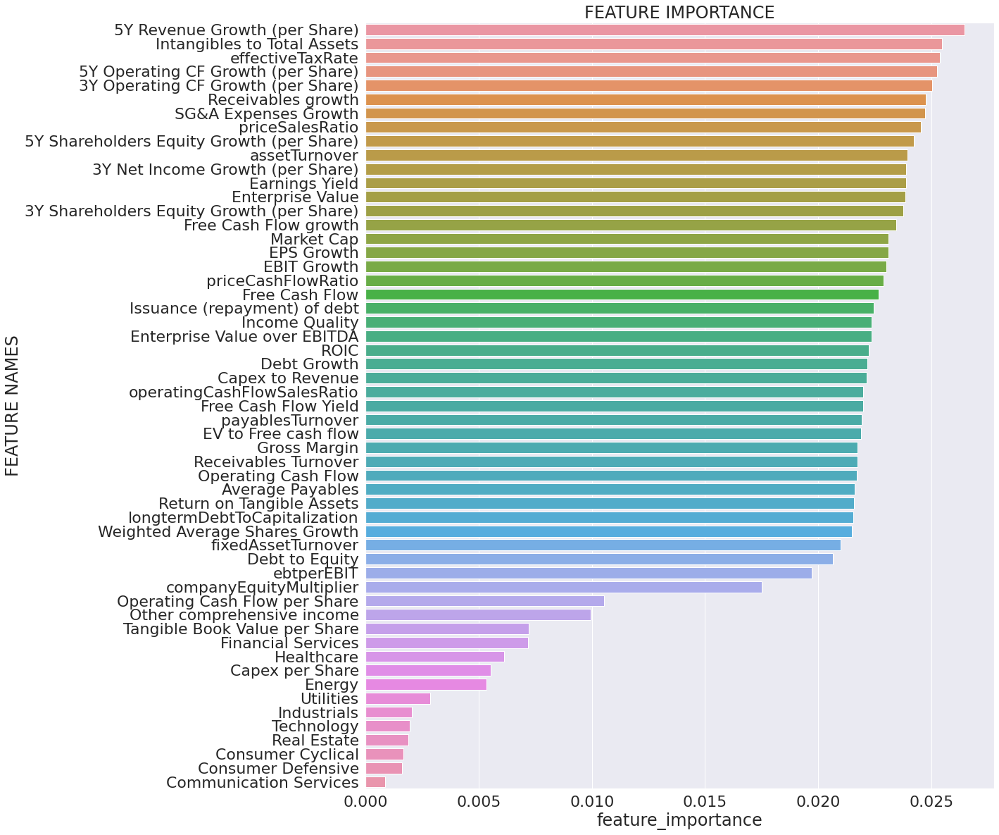

In [ ]:
model = ExtraTreesClassifier()
model.fit(X,y)

#Create arrays from feature importance and feature names
feature_importance = np.array(model.feature_importances_)
feature_names = np.array(X.columns)

#Create a DataFrame using a Dictionary
data={'feature_names':feature_names,'feature_importance':feature_importance}
fi_df = pd.DataFrame(data)

#Sort the DataFrame in order decreasing feature importance
fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

#Define size of bar plot
plt.figure(figsize=(16,20))
#Plot Searborn bar chart
sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
#Add chart labels
plt.title('FEATURE IMPORTANCE')
plt.ylabel('FEATURE NAMES')


#**FINAL DATA** 🎓 🎌



> 55 features 🔢




In [ ]:
print(len(X.columns))

55




> 19,757 samples 🌈



In [ ]:
print(len(X))

19757




> 10,790 Up stocks 🟢 ⬆


> 8,967 Down stocks 🔴 ⬇






In [ ]:
y.value_counts()

1.00000    10790
0.00000     8967
Name: Class, dtype: int64



> 19,526 outliers 🚩
↕ 


In [ ]:
cols =df_cp_clean_afterCorr.columns 

Q1 = df_cp_clean_afterCorr[cols].quantile(0.25)
Q3 = df_cp_clean_afterCorr[cols].quantile(0.75)
IQR = Q3 - Q1

df_clean_outliers =df_cp_clean_afterCorr[((df_cp_clean_afterCorr[cols] < (Q1 - 3 * IQR)) |(df_cp_clean_afterCorr[cols] > (Q3 + 3 * IQR))).any(axis=1)]
len(df_clean_outliers) 

19526



> There are no null values ✅



In [ ]:
X.isna().any(axis=1).sum()

0

# **Models** ✌

##classification 🌓

In [ ]:
#Split the data to 3 groups: TRAIN , VALIDATION & TEST
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1234)
X_train, X_validation, y_train, y_validation = train_test_split(X, y, test_size=0.25, random_state=1234)
#Crate 3 df to each group
train_df = pd.merge(left=X_train, right=y_train, left_index=True, right_index=True)
validation_df = pd.merge(left=X_validation, right=y_validation, left_index=True, right_index=True)
test_df = pd.merge(left=X_test, right=y_test, left_index=True, right_index=True)
train_df.head(2) 

,Gross Margin,Other comprehensive income,Operating Cash Flow,Issuance (repayment) of debt,Free Cash Flow,priceCashFlowRatio,priceSalesRatio,ebtperEBIT,effectiveTaxRate,payablesTurnover,fixedAssetTurnover,assetTurnover,longtermDebtToCapitalization,companyEquityMultiplier,operatingCashFlowSalesRatio,Operating Cash Flow per Share,Tangible Book Value per Share,Market Cap,Enterprise Value,Enterprise Value over EBITDA,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Income Quality,Intangibles to Total Assets,Capex to Revenue,ROIC,Return on Tangible Assets,Average Payables,Receivables Turnover,Capex per Share,EBIT Growth,EPS Growth,Weighted Average Shares Growth,Free Cash Flow growth,5Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Debt Growth,SG&A Expenses Growth,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,Class
8167,0.95346,0.00006,0.10573,0.57402,0.52820,0.00000,0.00000,0.30306,0.80333,0.00546,0.00086,0.00647,0.02160,0.00000,0.32290,0.35510,0.00000,0.00006,0.11946,0.00032,0.84644,0.44085,0.93332,0.54827,0.13346,0.11917,0.84783,0.31942,0.49914,0.02804,0.00019,0.98311,0.45051,0.32675,0.00000,0.91221,0.12526,0.29831,0.13640,0.06274,0.17543,0.06040,0.00007,0.00004,0.00117,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000
16960,0.94819,0.00006,0.10599,0.57634,0.52881,0.00001,0.00000,0.30300,0.80305,0.00506,0.00087,0.00734,0.02940,0.00000,0.32290,0.35483,0.00000,0.00007,0.12403,0.00026,0.84631,0.44085,0.93334,0.54908,0.13344,0.47136,0.84782,0.31937,0.49934,0.02877,0.00022,0.98317,0.45051,0.32683,0.00000,0.91220,0.10809,0.21837,0.10539,0.09635,0.13672,0.05082,0.00008,0.00006,0.00115,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000


###Logistic Regression model ☝

In [ ]:
#Logistic Regression
logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)
probability = logmodel.predict_proba(X_train)
prediction = logmodel.predict(X_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
#Results of the training set
y_train_prob_0 = pd.Series(probability[:,0], name ='probability_0', index=y_train.index)
y_train_prob_1 = pd.Series(probability[:,1], name ='probability_1', index=y_train.index)
y_train_pred   = pd.Series(prediction      , name ='prediction'   , index=y_train.index)

train_results = pd.DataFrame(data={'probability_0':y_train_prob_0, 'probability_1':y_train_prob_1,'prediction':y_train_pred, 'actual':y_train})
train_results.head()

,probability_0,probability_1,prediction,actual
8167,0.50605,0.49395,0.00000,0.00000
16960,0.45066,0.54934,1.00000,1.00000
13130,0.41909,0.58091,1.00000,0.00000
8062,0.52700,0.47300,0.00000,1.00000
17957,0.28904,0.71096,1.00000,0.00000


In [ ]:
#Test on validation set
probability = logmodel.predict_proba(X_validation)
prediction = logmodel.predict(X_validation) 

In [ ]:
#Results of the validation set
y_validation_prob_0 =pd.Series(probability[:,0], name='probability_0', index=y_validation.index)
y_validation_prob_1 =pd.Series(probability[:,1], name='probability_1', index=y_validation.index)
y_validation_pred = pd.Series(prediction, name='prediction', index=y_validation.index)

validation_results = pd.DataFrame(data={'probability_0':y_validation_prob_0, 'probability_1':y_validation_prob_1,'prediction':y_validation_pred, 'actual':y_validation})
validation_results.head()


,probability_0,probability_1,prediction,actual
11577,0.44519,0.55481,1.00000,0.00000
14918,0.30401,0.69599,1.00000,1.00000
5569,0.44958,0.55042,1.00000,1.00000
4981,0.49186,0.50814,1.00000,1.00000
9054,0.47038,0.52962,1.00000,1.00000


In [ ]:
#classification report for logistic regression - validation set
print(classification_report(y_validation,y_validation_pred))

              precision    recall  f1-score   support

         0.0       0.56      0.38      0.45      2208
         1.0       0.60      0.76      0.67      2732

    accuracy                           0.59      4940
   macro avg       0.58      0.57      0.56      4940
weighted avg       0.58      0.59      0.57      4940



In [ ]:
#classification report for logistic regression - test set
probability_test = logmodel.predict_proba(X_test)
prediction_test = logmodel.predict(X_test) 
y_test_pred = pd.Series(prediction_test, name='prediction', index=y_test.index)
print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

         0.0       0.56      0.38      0.46      1778
         1.0       0.60      0.76      0.67      2174

    accuracy                           0.59      3952
   macro avg       0.58      0.57      0.56      3952
weighted avg       0.58      0.59      0.57      3952



**accuracy 0.59**

The results show that our model better predicts stocks that have risen than stocks that have fallen



---
It can not be concluded that the gap arises from the fact that the data is unbalanced. 

It can be seen that in the training set and the test set a similar proportion of stocks rose and fell


In [ ]:
class_train_lr = pd.DataFrame(train_results.actual.value_counts())
class_train_lr['%'] = round(class_train_lr.actual/class_train_lr.actual.sum()*100)
class_train_lr

,actual,%
1.00000,8058,54.00000
0.00000,6759,46.00000


In [ ]:
class_validation_lr = pd.DataFrame(validation_results.actual.value_counts())
class_validation_lr['%'] = round(class_validation_lr.actual/class_validation_lr.actual.sum()*100)
class_validation_lr

,actual,%
1.00000,2732,55.00000
0.00000,2208,45.00000


### 🌴 🌳 🌲 Random Forest 🌲🌳 🌴

In [ ]:
#Random forest
rfc = RandomForestClassifier(n_estimators=33,criterion='entropy',max_depth = 11)
rfc.fit(X_train,y_train)

#Test on validation set
y_predict = rfc.predict(X_validation)

# Calculate the absolute errors
errors = abs(y_predict - y_validation)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

Mean Absolute Error: 0.38 degrees.


In [ ]:
#confusion matrix & classification report for random forest
print(confusion_matrix(y_validation,y_predict))
print('----------------------------------------------------------')
print(classification_report(y_validation,y_predict))

[[ 994 1214]
 [ 686 2046]]
----------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.59      0.45      0.51      2208
         1.0       0.63      0.75      0.68      2732

    accuracy                           0.62      4940
   macro avg       0.61      0.60      0.60      4940
weighted avg       0.61      0.62      0.61      4940



In [ ]:
#Finding the optimal number of trees in the forest - the default = 100
error_rate = []
for i in range(1,30):
    rfc = RandomForestClassifier(n_estimators=i,criterion='entropy',random_state=1234)
    rfc.fit(X_train,y_train)
    pred_i = rfc.predict(X_validation)
    error_rate.append(np.mean(pred_i != y_validation))  

In [ ]:
#Graphic display
trace = go.Scatter(
    x=[i for i in range(1,30)],
    y=error_rate,
    mode='markers+lines', 
)
fig = go.Figure(trace)
fig.update_layout(
    title='Error by n_estimators', 
    xaxis_title='n_estimators',
    yaxis_title='Error rate'
)

fig.show()



---
**The optimal number of trees according to the calculation above is: 17** 🌳 


In [ ]:
#Finding The maximum depth of the tree - the default = None -->  then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples. this defult is 2.
#prune the tree --> avoid from overfitting
error_rate = []
for i in range(1,30):
    rfc = RandomForestClassifier(n_estimators=17, max_depth = i,criterion='entropy',random_state=1234)
    rfc.fit(X_train,y_train)
    pred_i = rfc.predict(X_validation)
    error_rate.append(np.mean(pred_i != y_validation))  

In [ ]:
#Graphic display
trace = go.Scatter(
    x=[i for i in range(1,30)],
    y=error_rate,
    mode='markers+lines', 
)
fig = go.Figure(trace)
fig.update_layout(
    title='Error by  max_depth', 
    xaxis_title=' max_depth',
    yaxis_title='Error rate'
)

fig.show()


---
**The optimum maximum depth for the model is: 11** 🍃

In [ ]:
#Finding the optimal combination of: number of trees in the forest & the maximum depth of each tree by minimal error rate
min_error = 100
error_rate = np.ones((50,50))
for i in range(1,50):
	for j in range (1,50):
		rfc = RandomForestClassifier(n_estimators = i, max_depth = j,criterion='entropy',random_state=1234)
		rfc.fit(X_train,y_train)
		pred_i = rfc.predict(X_validation)
		error_rate[i,j]= np.mean(pred_i != y_validation)
		error =  np.mean(pred_i != y_validation)
		if error < min_error:
			min_error = error
			num_trees = i
			depth = j

print('min error: ', min_error, ', num of trees:', num_trees ,', max depth: ',depth)

min error:  0.3769230769230769 , num of trees: 33 , max depth:  11


In [ ]:
error_rate.shape

(50, 50)

In [ ]:
error_rate_df = pd.DataFrame(error_rate)

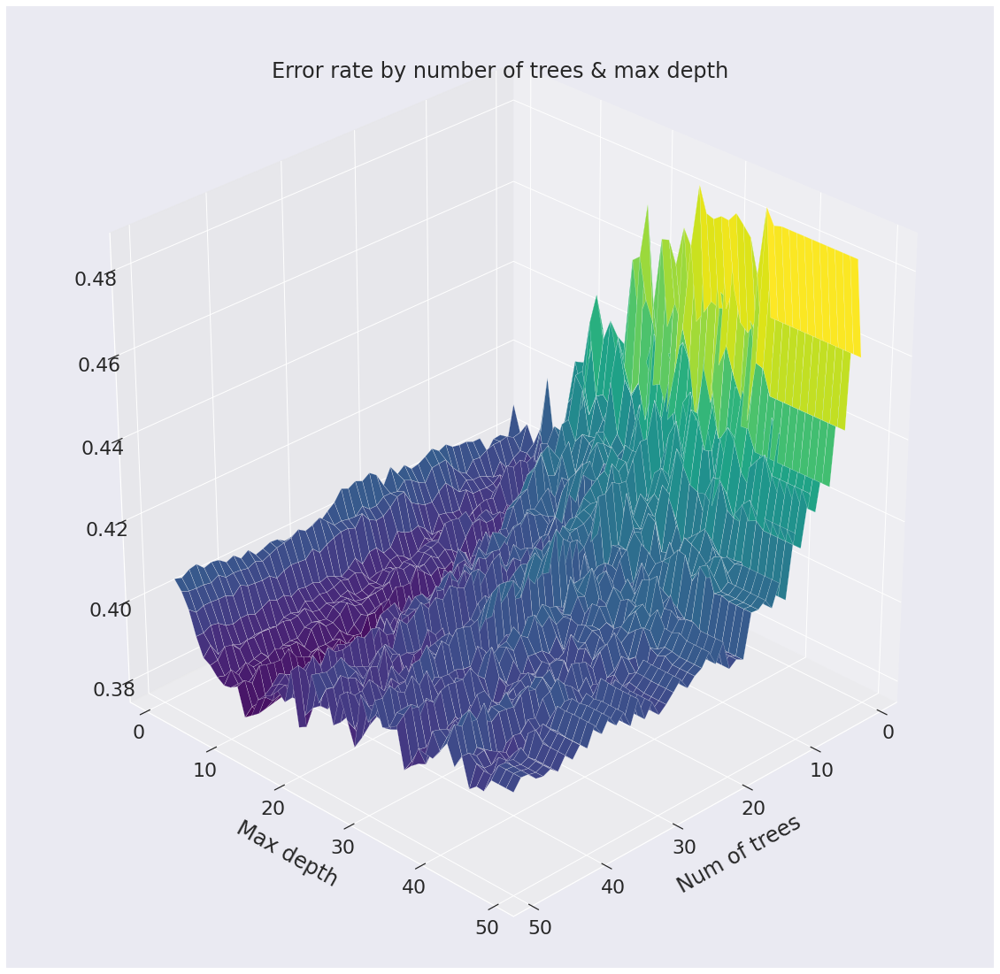

In [ ]:
#3D graph - plot the error in each combination of number of trees & the max depth
x_axis = np.arange(1, 50,1)
y_axis = np.arange(1, 50,1)
X_axis,Y_axis = np.meshgrid(x_axis,y_axis)
Z = error_rate[X_axis,Y_axis]


fig = plt.figure(figsize=(20,20))

ax = fig.add_subplot(111, projection='3d')


# Plot a 3D surface
ax.plot_surface(X_axis, Y_axis, Z, cmap=plt.cm.viridis, linewidth=0.2)
ax.view_init(30, 45)
ax.set_xlabel('Num of trees',labelpad=20)
ax.set_ylabel('Max depth',labelpad=20)
ax.set_title('Error rate by number of trees & max depth')

plt.show()



####Cross validation with random forest model ❎ 🎌

In [ ]:
#cross validation by ROC & accuracy
auc_scores = cross_val_score(rfc, X, y, cv=10, scoring='roc_auc')
auc_scores

array([0.62158177, 0.43678754, 0.53925814, 0.69972971, 0.48549743,
       0.57999118, 0.50101047, 0.46700763, 0.55752474, 0.66192293])

In [ ]:
accuracy_scores = cross_val_score(rfc, X, y, cv=10, scoring='accuracy')
accuracy_scores

array([0.58198381, 0.46305668, 0.54757085, 0.64574899, 0.49848178,
       0.5597166 , 0.50759109, 0.52911392, 0.56556962, 0.60303797])

In [ ]:
print('Mean values')
print('auc:', auc_scores.mean())
print('accuracy: ', accuracy_scores.mean())

Mean values
auc: 0.5550311547468864
accuracy:  0.5501871316558191


####Threshold for random forest ➗

In [ ]:
#ROC
pred = []
for model in [rfc, logmodel]:
    pred.append(pd.Series(model.predict_proba(X_validation)[:,1]))

final_pred = pd.concat(pred, axis=1).mean(axis=1)
print("Ensemble test roc-auc:{}".format(roc_auc_score(y_validation,final_pred)))

False_pos_rate, True_pos_rate, threshold = roc_curve(y_validation, final_pred)

threshold

Ensemble test roc-auc:0.6428075996774673


array([1.83551975, 0.83551975, 0.79623758, ..., 0.25399372, 0.25076911,
       0.2039241 ])

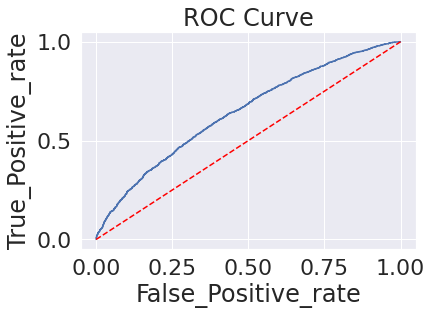

In [ ]:
#Plot ROC
def plot_roc_curve(False_pos_rate,True_pos_rate):
     plt.plot(False_pos_rate, True_pos_rate, label="ROC")
     plt.plot([0,1],[0,1],color="Red",linestyle="--")
     plt.xlabel("False_Positive_rate")
     plt.ylabel("True_Positive_rate")
     plt.title("ROC Curve")
     plt.legend
     plt.show()

plot_roc_curve(False_pos_rate,True_pos_rate)

In [ ]:
#Finding an optimal threshhold
acc = []

for thres in threshold:
    y_pred = np.where(final_pred>thres,1,0)
    #if the prediction is greater than threshold --> converting as 1 or keep it as 0

    acc.append(accuracy_score(y_validation,y_pred,normalize=True))
    #computing the accuracy score with y_validation and then append the accuracy inside acc list.

acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
acc.columns = ['threshold','accuracy']
acc.sort_values(by="accuracy", ascending=False, inplace = True)
acc.head()

,threshold,accuracy
1426,0.50163,0.60951
1569,0.48642,0.60951
1561,0.48714,0.60951
1465,0.49769,0.60951
1567,0.48662,0.60951



The optimal threshold is 0.51104 and the accuracy in this case is 0.61316.

The default threshold is 0.5 and its accuracy is 0.61

**Hence we decided to leave the default thrashhold**

####Feature importances for random forest 📉

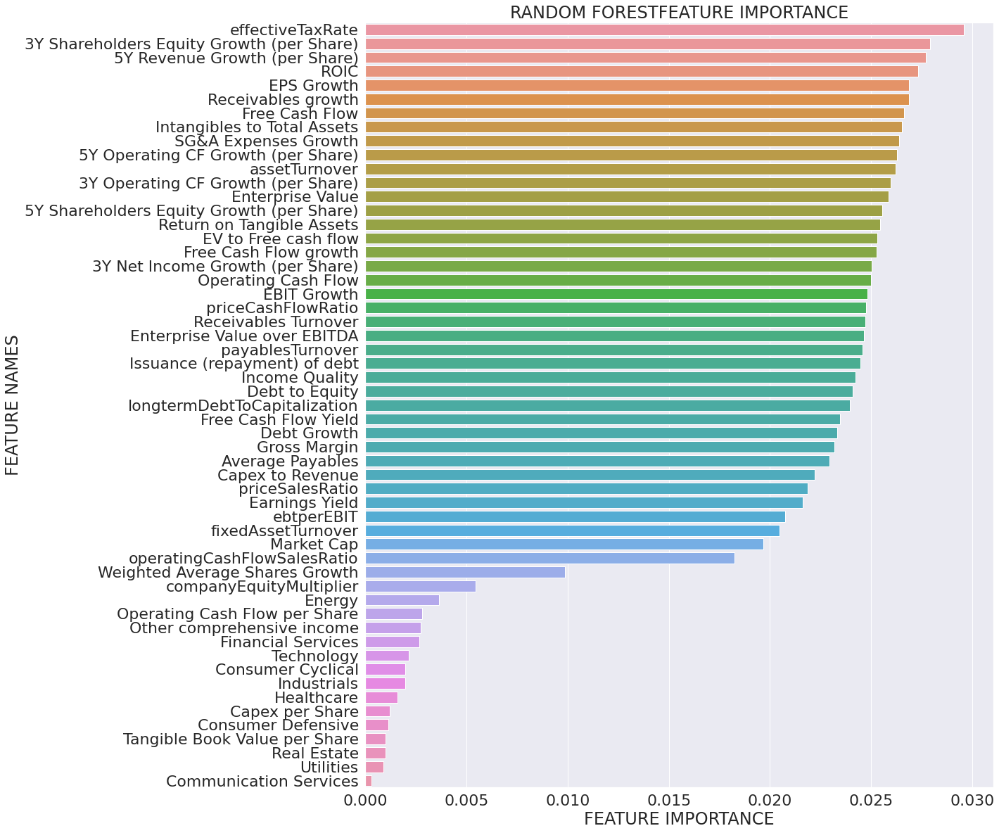

In [ ]:
#feature importances - random forest
def plot_feature_importance(importance,names,model_type):

    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(16,20))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + 'FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')


plot_feature_importance(rfc.feature_importances_,X_train.columns,'RANDOM FOREST')

In [ ]:
#Dropping the low-score features & re-running the model
featuresImportance_threshold = 0.005        
vars_to_keep = fi_df[fi_df.feature_importance > featuresImportance_threshold] #Series with column names and their correlation coefficients
feature_names = vars_to_keep.feature_names

X_train_RD =X_train[feature_names]
rfc.fit(X_train_RD,y_train)
X_validation_RD = X_validation[feature_names]
y_predict = rfc.predict(X_validation_RD)

print(confusion_matrix(y_validation,y_predict))
print('---------------------------VALIDATION-------------------------------')
print(classification_report(y_validation,y_predict))

print('---------------------------TEST-------------------------------')

X_test_RD = X_test[feature_names]
y_predict_test = rfc.predict(X_test_RD)
print(classification_report(y_test,y_predict_test))

[[1089 1119]
 [ 844 1888]]
---------------------------VALIDATION-------------------------------
              precision    recall  f1-score   support

         0.0       0.56      0.49      0.53      2208
         1.0       0.63      0.69      0.66      2732

    accuracy                           0.60      4940
   macro avg       0.60      0.59      0.59      4940
weighted avg       0.60      0.60      0.60      4940

---------------------------TEST-------------------------------
              precision    recall  f1-score   support

         0.0       0.57      0.50      0.53      1778
         1.0       0.63      0.69      0.66      2174

    accuracy                           0.60      3952
   macro avg       0.60      0.59      0.59      3952
weighted avg       0.60      0.60      0.60      3952



####Plot a Decision Tree 🌴

In [ ]:
#we can prune the tree by specifing the max depth
dtree = DecisionTreeClassifier(criterion="entropy")
dtree.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [ ]:
#plot a tree
features = list(X.columns)

fig = plt.figure(figsize=(60,60),dpi=200)
tree_img = tree.plot_tree(dtree, 
                   feature_names=features,  
                   filled=True,)
fig.show()
#On the tree the Left branch is the True answer and Right branch is the False answer (according to the rule)
#Kyphosis = Blue Leaves
#No Kyphosis = Dark orange Leaves

**Random forests are made up of many decision trees.**

***In our case 33 trees***

###KNN  👥 🏡

In [ ]:
#KNN model
knn = KNeighborsClassifier(n_neighbors = 27)
knn.fit(X_train, y_train)
prediction = knn.predict(X_train)

#Results of the training set
y_train_pred = pd.Series(prediction, name='prediction', index=y_train.index)
train_results = pd.DataFrame(data={'prediction':y_train_pred, 'actual':y_train})
train_results.head()

,prediction,actual
8167,1.00000,0.00000
16960,1.00000,1.00000
13130,1.00000,0.00000
8062,1.00000,1.00000
17957,1.00000,0.00000


In [ ]:
#accuracy
accu = metrics.accuracy_score(y_train, y_train_pred)
accu

0.623608017817372

In [ ]:
##Test on validation set
y_pred = knn.predict(X_validation)
y_validation_pred = pd.Series(y_pred, name='prediction', index=y_validation.index)

#Results of the validation set
validation_results = pd.DataFrame(data={'prediction':y_validation_pred, 'actual':y_validation})
validation_results.head()

,prediction,actual
11577,1.00000,0.00000
14918,1.00000,1.00000
5569,0.00000,1.00000
4981,1.00000,1.00000
9054,0.00000,1.00000


In [ ]:
#classification report for KNN
print(classification_report(y_validation, y_pred))

              precision    recall  f1-score   support

         0.0       0.55      0.41      0.47      2208
         1.0       0.60      0.73      0.66      2732

    accuracy                           0.58      4940
   macro avg       0.58      0.57      0.56      4940
weighted avg       0.58      0.58      0.57      4940



In [ ]:
class_train_knn = pd.DataFrame(train_results.actual.value_counts())
class_train_knn['%'] = round(class_train_knn.actual/class_train_knn.actual.sum()*100)
class_train_knn

,actual,%
1.00000,8058,54.00000
0.00000,6759,46.00000


In [ ]:
class_validation_knn = pd.DataFrame(validation_results.actual.value_counts())
class_validation_knn['%'] = round(class_validation_knn.actual/class_validation_knn.actual.sum()*100)
class_validation_knn

,actual,%
1.00000,2732,55.00000
0.00000,2208,45.00000


---
It can not be concluded that the gap arises from the fact that the data is unbalanced. 

It can be seen that in the training set and the test set a similar proportion of stocks rose and fell

####choosing K value 🔝

In [ ]:
##Finding the optimal number of neighbors 
error_rate = []
for i in range(1,100):
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_validation)
    error_rate.append(np.mean(pred_i != y_validation))   

In [ ]:
#Graphic display
trace = go.Scatter(
    x=[i for i in range(1,50)],
    y=error_rate,
    mode='markers+lines', 
)
fig = go.Figure(trace)
fig.update_layout(
    title='Error by K Value', 
    xaxis_title='k neighboors',
    yaxis_title='Error rate'
)

fig.show()

**K = 31 was chosen because it is an odd number and the error according to the graph seems to be the smallest**

In [ ]:
#classification report for KNN
knn = KNeighborsClassifier(n_neighbors = 31)
knn.fit(X_train, y_train)
pred_train = knn.predict(X_train)
print(metrics.accuracy_score(y_train, pred_train))

print('=======================VALIDATION====================')

pred = knn.predict(X_validation)
print(confusion_matrix(y_validation, pred))
print(classification_report(y_validation, pred))

print(knn.score(X_validation, y_validation))

print('========================TEST=========================')

pred_test = knn.predict(X_test)
y = pd.merge(y_train,y_validation)

print(classification_report(y_test, pred_test))
print(knn.score(X_test, y_test))

0.6173314436120673
=======================VALIDATION====================
[[ 911 1297]
 [ 722 2010]]
              precision    recall  f1-score   support

         0.0       0.56      0.41      0.47      2208
         1.0       0.61      0.74      0.67      2732

    accuracy                           0.59      4940
   macro avg       0.58      0.57      0.57      4940
weighted avg       0.59      0.59      0.58      4940

0.5912955465587044
========================TEST=========================
              precision    recall  f1-score   support

         0.0       0.57      0.42      0.48      1778
         1.0       0.61      0.74      0.67      2174

    accuracy                           0.59      3952
   macro avg       0.59      0.58      0.57      3952
weighted avg       0.59      0.59      0.58      3952

0.5936234817813765


## **Linear Regression** 📈 

In [ ]:
df_cp_clean_afterCorr.Class.value_counts()

1.00000    10790
0.00000     8967
Name: Class, dtype: int64

**Histogram of the target**

In [ ]:
#PRICE_VAR histogram
fig = go.Figure()
fig.add_trace(go.Histogram(x=df_cp_clean['PRICE_VAR'],marker_color='steelblue'))
fig.update_layout(height=800,width=1000,bargap=0.2,title_text="PRICE_VAR",)
fig.show()

**It can be seen that the distribution of the explained variable is around a value of 0**

### Building a  Multiple  Linear Regression model

In [ ]:
#Set our X,y
y_Linear=df_cp_clean.PRICE_VAR #Series
X_Linear_df =df_cp_clean.drop(['PRICE_VAR','Class','Year'], axis=1)
X_Linear_df.head()

,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities
PG14,74401000000.00000,-0.07130,39030000000.00000,35371000000.00000,21461000000.00000,21461000000.00000,13910000000.00000,709000000.00000,14494000000.00000,2851000000.00000,11643000000.00000,11643000000.00000,4.19000,4.01000,2705960276.00000,2705960276.00000,0.47540,0.24700,0.20430,0.1560

In [ ]:
#split the data
X_Linear_train, X_Linear_test, y_Linear_train, y_Linear_test = train_test_split(X_Linear_df, y_Linear, test_size=0.3,random_state=1234)
train_Linear_df = pd.merge(left=X_Linear_df, right=y_Linear_train, left_index=True, right_index=True)
test_Linear_df = pd.merge(left=X_Linear_test, right=y_Linear_test, left_index=True, right_index=True)

train_Linear_df.head(2)

,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,PRICE_VAR
PG14,74401000000.00000,-0.07130,39030000000.00000,35371000000.00000,21461000000.00000,21461000000.00000,13910000000.00000,709000000.00000,14494000000.00000,2851000000.00000,11643000000.00000,11643000000.00000,4.19000,4.01000,2705960276.00000,2705960276.00000,0.47540,0.24700,0.20

In [ ]:
#Data scaled
x_train_scaler = StandardScaler()
x_test_scaler = StandardScaler()
y_train_scaler = StandardScaler()
y_test_scaler = StandardScaler()

X_train_scaled = x_train_scaler.fit_transform(X_Linear_train)
X_test_scaled = x_test_scaler.fit_transform(X_Linear_test)
y_train_scaled = y_train_scaler.fit_transform(pd.DataFrame(y_Linear_train))
y_test_scaled = y_test_scaler.fit_transform(pd.DataFrame(y_Linear_test))


In [ ]:
#Linear Regression
lm = LinearRegression()  # define our model using least square method
lm.fit(X_train_scaled,y_train_scaled)              # Fit our linear model
# The coefficients
coeff = lm.coef_[0]
intercept = lm.intercept_[0]
print('Coefficients: \n', "coeff =", coeff , ",  Intercept=",intercept,"\n" ) #Print all coefficients
print("The regression equation is:" ,"PriceK = " ,intercept," + ",coeff[0]," * ",X_Linear_df.columns[0],
      " + ",coeff[1]," * ",X_Linear_df.columns[1]," + ",coeff[2]," * ",X_Linear_df.columns[2]," + ",coeff[3]," * ",X_Linear_df.columns[3] ) #Print the first four coefficients with their features

Coefficients: 
 coeff = [ 1.65183063e-02 -1.03053838e-03 -1.15864876e-02 -5.07001393e-03
 -2.20332150e-03  4.39514475e-03  8.53985013e-03 -2.30713913e-03
  1.58403844e-01 -5.90046286e-02  1.34358316e-02 -1.15007901e-01
  2.85131114e+01 -2.78815150e+01 -1.17728971e-03  1.94676556e-03
 -1.59610466e-03 -2.58627593e-02 -1.05258842e-02  2.58074753e-02
 -2.19677094e-02 -3.33413832e-03  2.86707632e-03 -2.71546400e-02
 -6.96156632e-02  6.95411186e-02  5.51114805e-03  1.69944823e-03
 -9.35257200e-04  2.65351189e-02  1.23459485e-03  2.45087933e-03
  3.20577752e+00  4.31014930e-02 -9.51459250e-03 -3.10102906e-03
  7.30867974e-02 -3.14425732e-04 -1.72512750e-03 -1.67338659e+01
 -8.20148657e-02  2.33736673e+01  4.09013987e-03 -1.11935229e-02
 -4.64921573e-03  2.39297453e-03  4.93201833e-05 -7.41623829e-02
  3.88110933e-03 -2.26522547e-03 -8.17138520e-03  1.19300902e-03
  2.37833188e-03 -5.02554887e-04  3.05246272e-03  1.05453220e-03
 -4.77677494e-03  3.26839787e-03 -3.41186151e-02 -1.04341597e+10
 

In [ ]:
#use lm.predict(X_train) for all the living area data from the train set
fitted_scaled_price = lm.predict(X_train_scaled) # returns ndarray
#inverse the minmax scaler transformation
fitted_price = y_train_scaler.inverse_transform(fitted_scaled_price)

In [ ]:
#create a pandas series of the results
predicted_Linear_train_price_var = round(pd.Series(fitted_price[:,0], index=y_Linear_train.index, name='Predicted_train_price_var'),ndigits=2)

In [ ]:
#Add the results to the DF
train_Linear_df = pd.merge(left=train_Linear_df, right=predicted_Linear_train_price_var , left_index=True, right_index=True)
train_Linear_df.head()

,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,PRICE_VAR,Predicted_train_price_var
PG14,74401000000.00000,-0.07130,39030000000.00000,35371000000.00000,21461000000.00000,21461000000.00000,13910000000.00000,709000000.00000,14494000000.00000,2851000000.00000,11643000000.00000,11643000000.00000,4.19000,4.01000,2705960276.00000,2705960276.

In [ ]:
#Test the model
fitted_scaled_price_var = lm.predict(X_test_scaled)
fitted_price_var = y_test_scaler.inverse_transform(fitted_scaled_price_var)
predicted_Linear_test_price_var = round(pd.Series(fitted_price_var[:,0], index=y_Linear_test.index, name='Predicted_test_price_var'),ndigits=2)
test_Linear_df = pd.merge(left=test_Linear_df, right=predicted_Linear_test_price_var, left_index=True, right_index=True)
test_Linear_df.head()

,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,Income Tax Expense,Net Income,Net Income Com,EPS,EPS Diluted,Weighted Average Shs Out,Weighted Average Shs Out (Dil),Gross Margin,EBITDA Margin,EBIT Margin,Profit Margin,Free Cash Flow margin,EBITDA,EBIT,Consolidated Income,Earnings Before Tax Margin,Net Profit Margin,Cash and cash equivalents,Cash and short-term investments,Receivables,Total current assets,"Property, Plant & Equipment Net",Goodwill and Intangible Assets,Total non-current assets,Total assets,Payables,Short-term debt,Total current liabilities,Long-term debt,Total debt,Total non-current liabilities,Total liabilities,Other comprehensive income,Retained earnings (deficit),Total shareholders equity,Investments,Net Debt,Other Assets,Other Liabilities,Depreciation & Amortization,Stock-based compensation,Operating Cash Flow,Capital Expenditure,Investing Cash flow,Issuance (repayment) of debt,Issuance (buybacks) of shares,Financing Cash Flow,Net cash flow / Change in cash,Free Cash Flow,Net Cash/Marketcap,priceBookValueRatio,priceToBookRatio,priceToSalesRatio,priceEarningsRatio,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceSalesRatio,enterpriseValueMultiple,priceFairValue,ebitperRevenue,ebtperEBIT,niperEBT,grossProfitMargin,pretaxProfitMargin,netProfitMargin,effectiveTaxRate,returnOnAssets,returnOnEquity,returnOnCapitalEmployed,nIperEBT,eBTperEBIT,eBITperRevenue,payablesTurnover,fixedAssetTurnover,assetTurnover,currentRatio,quickRatio,cashRatio,daysOfInventoryOutstanding,daysOfPayablesOutstanding,debtRatio,debtEquityRatio,longtermDebtToCapitalization,totalDebtToCapitalization,interestCoverage,cashFlowToDebtRatio,companyEquityMultiplier,operatingCashFlowPerShare,freeCashFlowPerShare,cashPerShare,operatingCashFlowSalesRatio,freeCashFlowOperatingCashFlowRatio,cashFlowCoverageRatios,capitalExpenditureCoverageRatios,dividendpaidAndCapexCoverageRatios,Revenue per Share,Net Income per Share,Operating Cash Flow per Share,Free Cash Flow per Share,Cash per Share,Book Value per Share,Tangible Book Value per Share,Shareholders Equity per Share,Interest Debt per Share,Market Cap,Enterprise Value,PE ratio,Price to Sales Ratio,POCF ratio,PFCF ratio,PB ratio,PTB ratio,EV to Sales,Enterprise Value over EBITDA,EV to Operating cash flow,EV to Free cash flow,Earnings Yield,Free Cash Flow Yield,Debt to Equity,Debt to Assets,Net Debt to EBITDA,Current ratio,Interest Coverage,Income Quality,SG&A to Revenue,Intangibles to Total Assets,Capex to Operating Cash Flow,Capex to Revenue,Capex to Depreciation,Stock-based compensation to Revenue,Graham Number,ROIC,Return on Tangible Assets,Graham Net-Net,Working Capital,Tangible Asset Value,Net Current Asset Value,Invested Capital,Average Receivables,Average Payables,Days Sales Outstanding,Days Payables Outstanding,Receivables Turnover,Payables Turnover,ROE,Capex per Share,Gross Profit Growth,EBIT Growth,Operating Income Growth,Net Income Growth,EPS Growth,EPS Diluted Growth,Weighted Average Shares Growth,Weighted Average Shares Diluted Growth,Operating Cash Flow growth,Free Cash Flow growth,5Y Revenue Growth (per Share),3Y Revenue Growth (per Share),5Y Operating CF Growth (per Share),3Y Operating CF Growth (per Share),5Y Net Income Growth (per Share),3Y Net Income Growth (per Share),5Y Shareholders Equity Growth (per Share),3Y Shareholders Equity Growth (per Share),Receivables growth,Asset Growth,Book Value per Share Growth,Debt Growth,SG&A Expenses Growth,Communication Services,Consumer Cyclical,Consumer Defensive,Energy,Financial Services,Healthcare,Industrials,Real Estate,Technology,Utilities,PRICE_VAR,Predicted_test_price_var
EPC17,2298400000.00000,-0.02690,1167800000.00000,1130600000.00000,708300000.00000,1114300000.00000,16300000.00000,69200000.00000,-52900000.00000,-58600000.00000,5700000.00000,5700000.00000,0.10000,0.10000,56971319.00000,56971319.00000,0.49190,0.04800,0.0

### Method 1: Residual Analysis

In [ ]:
#calculate the residuals
train_Linear_df['residuals'] = train_Linear_df.Predicted_train_price_var - train_Linear_df.PRICE_VAR
test_Linear_df['residuals'] = test_Linear_df.Predicted_test_price_var - test_Linear_df.PRICE_VAR

In [ ]:
#plot the residuals graph
fig= go.Figure()
fig.add_trace(
    go.Scatter(
        x=train_Linear_df.Predicted_train_price_var,
        y=train_Linear_df.residuals,
        mode='markers',
        name='train residuals',
        marker_color='blue',
        marker_size=1.5,
        marker_line_width=0,

    )
)
fig.add_trace(
  go.Scatter(
      x=test_Linear_df.Predicted_test_price_var,
      y=test_Linear_df.residuals,
      mode='markers',
      name='test residuals',
      marker_color='red',
      marker_size=1.5,
      marker_line_width=0,

  )
)

fig.add_trace(
  go.Scatter(
      x=test_Linear_df.Predicted_test_price_var,
      y=test_Linear_df.residuals*0,
      mode='lines',
      name='zero line',
      marker_color='black',
      marker_size=1.5,
      marker_line_width=0,

  )
)
fig.update_layout(
    title="Residuals of Predicted prices",
    xaxis_title="Predicted Price",
    yaxis_title="Residuals",
    font=dict(
        size=14,
        color="RebeccaPurple"
    )
)
fig.show()



---


Our model better predicts stocks whose annual change is relatively small, this is because the spread is around 0. 

On the other hand, it is very difficult to predict higher changes.

###Method 2: Cost functions metrics

In [ ]:
print("------ TRAIN DATA ------")
print("MSE:",metrics.mean_squared_error(train_Linear_df.PRICE_VAR, train_Linear_df.Predicted_train_price_var))
print("RMSE:",np.sqrt(metrics.mean_squared_error(train_Linear_df.PRICE_VAR, train_Linear_df.Predicted_train_price_var)))
print("MAE:",metrics.mean_absolute_error(train_Linear_df.PRICE_VAR, train_Linear_df.Predicted_train_price_var))

print("------ TEST DATA ------")
print("MSE:",metrics.mean_squared_error(test_Linear_df.PRICE_VAR, test_Linear_df.Predicted_test_price_var))
print("RMSE:",np.sqrt(metrics.mean_squared_error(test_Linear_df.PRICE_VAR, test_Linear_df.Predicted_test_price_var)))
print("MAE:",metrics.mean_absolute_error(test_Linear_df.PRICE_VAR,  test_Linear_df.Predicted_test_price_var))

------ TRAIN DATA ------
MSE: 44826305.302234404
RMSE: 6695.244977014239
MAE: 349.88603668150967
------ TEST DATA ------
MSE: 302514260.2352427
RMSE: 17392.9370790342
MAE: 5105.437042770471




---

Ideally, the RMSE should be similar between the training set and the test set.

In our case the RMSE value of the training set is much lower than that of the test set which indicates **overfitting**.

###Method 3: Coefficient of determination,  R2

In [ ]:
#get R2 for train set
print('r2 train: ', r2_score(train_Linear_df.PRICE_VAR, train_Linear_df.Predicted_train_price_var))
#get R2 for test set
print('r2 test: ', r2_score(test_Linear_df.PRICE_VAR, test_Linear_df.Predicted_test_price_var)) #the chosen model (with its constraints) fits the data really poorly

r2 train:  0.06790852233101796
r2 test:  -732.5080824376225


**A negative R2 means that the model predicts a rise / fall of stocks poorly.**

###Method 4: RMSE Vs STD

In [ ]:
print('STD TRAIN:' , np.std(train_Linear_df.PRICE_VAR), ' -VS-  RMSE TRAIN:',np.sqrt(metrics.mean_squared_error(train_Linear_df.PRICE_VAR, train_Linear_df.Predicted_train_price_var)))
print('STD TEST:', np.std(test_Linear_df.PRICE_VAR), ' -VS-  RMSE TEST: ', np.sqrt(metrics.mean_squared_error(test_Linear_df.PRICE_VAR, test_Linear_df.Predicted_test_price_var)))

STD TRAIN: 6934.852107854509  -VS-  RMSE TRAIN: 6695.244977014239
STD TEST: 642.200255519518  -VS-  RMSE TEST:  17392.9370790342


TRAIN = BAD 🚩

TEST = BAD 🚩